# Smoothness heuristic

In [1]:
import numpy as np
np.set_printoptions(linewidth=2000, threshold=10000)
import matplotlib.pyplot as plt
from matplotlib import colors as mcolors
from pprint import pprint

# Importing custom modules
from modules import laplacian
from modules import jacobian
from modules import correspondences

## Functions

### Heuristics

In [2]:
def get_3x3_vector_patch(deformation, y, x):
    """
    Given a deformation field of shape (3, y_dim, x_dim, ...), 
    return a 3x3x3 patch centered at (y, x) for the first slice (if 4D).
    deformation: numpy array of shape (3, y_dim, x_dim) or (3, 1, y_dim, x_dim)
    x, y: center coordinates (int)
    Returns: numpy array of shape (3, 3, 3)
    """
    y_dim, x_dim = deformation.shape[2], deformation.shape[3]

    x_start = min(max(x - 1, 0), x_dim - 3)
    x_end = x_start + 3
    y_start = min(max(y - 1, 0), y_dim - 3)
    y_end = y_start + 3
    
    patch = deformation[:, 0, y_start:y_end, x_start:x_end]
    patch = patch[:, :3, :3]

    # Flatten patch to (3, 9), find center index, exclude it, and compute mean
    patch_flat = patch.reshape(3, -1)
    idx_center = (y - y_start) * 3 + (x - x_start)
    patch_wo_center = np.delete(patch_flat, idx_center, axis=1)
    avg_vec = np.mean(patch_wo_center, axis=1)

    return patch, avg_vec


def min_coords(arr):
    """
    Given a 2D numpy array, return the (row, col) y, x coordinates of the smallest value.
    """
    idx = np.unravel_index(np.argmin(arr), arr.shape)
    return idx


def orientation_heuristic(deformation):
    """
    For each (x, y) in the deformation field, compute the dot product between the vector at (x, y)
    and the mean vector of its 3x3 neighborhood (excluding itself).
    Returns a 2D array of dot products with shape (y_dim, x_dim).
    """
    y_dim, x_dim = deformation.shape[2], deformation.shape[3]
    result = np.zeros((y_dim, x_dim))
    for y in range(y_dim):
        for x in range(x_dim):
            # Get 3x3 patch, shifted if near edge
            patch, avg_vec = get_3x3_vector_patch(deformation, y=y, x=x) 
            center_vec = deformation[:, 0, y, x]
            
            # Normalize both vectors
            norm_center = np.linalg.norm(center_vec)
            norm_avg = np.linalg.norm(avg_vec)
            
            # Compute dot product if both norms are non-zero
            if norm_center > 0 and norm_avg > 0:
                cos_theta = np.dot(center_vec, avg_vec) / (norm_center * norm_avg)
                cos_theta = (1 + cos_theta) / 2
            else:
                cos_theta = 0.0

            # Store the result
            result[y, x] = cos_theta
    return result


def magnitude_heuristic(deformation):
    """
    For each (x, y) in the deformation field, compute the dot product between the vector at (x, y)
    and the mean vector of its 3x3 neighborhood (excluding itself).
    Returns a 2D array of dot products with shape (y_dim, x_dim).
    """
    y_dim, x_dim = deformation.shape[2], deformation.shape[3]
    result = np.zeros((y_dim, x_dim))
    for y in range(y_dim):
        for x in range(x_dim):
            # Get 3x3 patch, shifted if near edge
            patch, avg_vec = get_3x3_vector_patch(deformation, y=y, x=x) 
            center_vec = deformation[:, 0, y, x]
            
            # Normalize both vectors
            norm_center = np.linalg.norm(center_vec)
            norm_avg = np.linalg.norm(avg_vec)
            
            # Compute magnitude heuristic
            if norm_center > 0 and norm_avg > 0:
                mag = 1 - np.abs(norm_center - norm_avg) / max(norm_center, norm_avg)
            else:
                mag = 0.0
                
            # Store the result
            result[y, x] = mag
    return result


def smoothness_heuristic(deformation):
    """
    For each (x, y) in the deformation field, compute the dot product between the vector at (x, y)
    and the mean vector of its 3x3 neighborhood (excluding itself).
    Returns a 2D array of dot products with shape (y_dim, x_dim).
    """
    y_dim, x_dim = deformation.shape[2], deformation.shape[3]
    result = np.zeros((y_dim, x_dim))
    for y in range(y_dim):
        for x in range(x_dim):
            # Get 3x3 patch, shifted if near edge
            patch, avg_vec = get_3x3_vector_patch(deformation, y=y, x=x) 
            center_vec = deformation[:, 0, y, x]
            
            # Normalize both vectors
            norm_center = np.linalg.norm(center_vec)
            norm_avg = np.linalg.norm(avg_vec)
            
            # Compute dot product if both norms are non-zero
            if norm_center > 0 and norm_avg > 0:
                cos_theta = np.dot(center_vec, avg_vec) / (norm_center * norm_avg)
                cos_theta = (1 + cos_theta) / 2
            else:
                cos_theta = 0.0
            
            # Compute magnitude heuristic
            if norm_center > 0 and norm_avg > 0:
                mag = 1 - np.abs(norm_center - norm_avg) / max(norm_center, norm_avg)
            else:
                mag = 0.0
                
            # Combine both metrics
            smoothness = cos_theta * mag
                
            # Store the result
            result[y, x] = smoothness
    return result


def replace_lowest_smoothness(deformation, heuristic_func):
    """
    Replace the vector at the coordinates of the lowest smoothness value with the average vector
    of its 3x3 neighborhood (excluding itself).
    """
    deformation_copy = deformation.copy()
    smoothness = heuristic_func(deformation_copy)
    min_coords_tuple = min_coords(smoothness)
    _, avg_vec = get_3x3_vector_patch(deformation_copy, *min_coords_tuple)
    
    deformation_copy[:, 0, min_coords_tuple[0], min_coords_tuple[1]] = avg_vec
    return deformation_copy


def l1_error(deformation1, deformation2):
    """
    Compute the L1 error between two deformation fields.
    """
    return np.sum(np.abs(deformation1 - deformation2))


def l2_error(deformation1, deformation2):
    """
    Compute the L2 error between two deformation fields.
    """
    return np.sqrt(np.sum((deformation1 - deformation2) ** 2))


### Visualization

In [3]:
def plot_deformation(msample, fsample, deformation, title="", figsize=(20, 10), show_values=True, show_points=True):
    """
    Plots the deformation field between two sets of points.
    """
    
    fig, axs = plt.subplots(nrows=1, ncols=2, figsize=figsize)
    
    # Calculate the Jacobian determinant
    J = np.squeeze(jacobian.sitk_jacobian_determinant(deformation))
    num_neg_J = np.sum(J <= 0)
    norm = mcolors.TwoSlopeNorm(vmin=min(J.min(), J.min(), -3), vcenter=0, vmax=max(J.max(), J.max(), 3))
    
    # Smoothness heuristic
    smoothness = smoothness_heuristic(deformation)

    # Draw lines connecting the points in the first subplot
    for i in range(len(msample)):  # Draw lines connecting the points
        axs[0].annotate(
            '', 
            xy=(fsample[i][2], fsample[i][1]), 
            xytext=(msample[i][2], msample[i][1]), 
            arrowprops=dict(facecolor='black', shrink=0.045, headwidth=8, headlength=10, width=3)
        )
    
    # Create a grid of points
    x, y = np.meshgrid(range(deformation.shape[3]), range(deformation.shape[2]), indexing='xy')

    # Plot the initial points and Jacobian determinant scores
    im = axs[0].imshow(J, cmap='seismic', norm=norm)
    axs[0].set_title(f"Jacobian determinant grid\n({num_neg_J} negative Jacobian values)")
    
    axs[0].set_xticks(np.arange(0, deformation.shape[3], 1))
    axs[0].set_yticks(np.arange(0, deformation.shape[2], 1))

    if show_values:
        # Add text for the values
        for i in range(J.shape[0]):
            for j in range(J.shape[1]):
                axs[0].text(j, i, f"{J[i, j]:.2f}", ha="center", va="center", color="black", fontsize=8)

        # Add text for the values
        for i in range(smoothness.shape[0]):
            for j in range(smoothness.shape[1]):
                axs[1].text(j, i + 0.3, f"{smoothness[i, j]:.2f}", ha="center", va="top", color="black", fontsize=8)

    # Plot the deformation vectors
    axs[1].set_title(f"Deformation vector field with {title} heuristic")
    axs[1].imshow(J, cmap='seismic', norm=norm)
    axs[1].quiver(x, y, deformation[2,0], deformation[1,0])
    
    axs[1].set_xticks(np.arange(0, deformation.shape[3], 1))
    axs[1].set_yticks(np.arange(0, deformation.shape[2], 1))
    
    if show_points:
        axs[0].scatter(msample[:, 2], msample[:, 1], c='g', label='Moving')
        axs[0].scatter(fsample[:, 2], fsample[:, 1], c='violet', label='Fixed')
        axs[0].legend()
        axs[1].scatter(msample[:, 2], msample[:, 1], c='g', label='Moving')
        axs[1].scatter(fsample[:, 2], fsample[:, 1], c='violet', label='Fixed')
        axs[1].legend()
    
    # Add colorbar
    cbar = fig.colorbar(im, ax=axs[1], fraction=0.046, pad=0.04)
    cbar.set_label('Jacobian determinant')
    
    # Draw very light grid lines between moving and fixed points
    for i in range(len(msample)):
        axs[1].plot(
            [msample[i][2], fsample[i][2]],
            [msample[i][1], fsample[i][1]],
            color='gray',
            linestyle='--',
            linewidth=1,
            alpha=0.5,
            zorder=1
        )
    
    # Invert y-axes
    axs[0].invert_yaxis()
    axs[1].invert_yaxis()
    
    plt.show()


## Run smoothness heuristic with correction 1

### Input parameters

In [4]:
msample = np.array([
    [0, 1, 2],
    [0, 1, 6],
    #[0, 8, 4],
    #[0, 4, 9]
])
fsample = np.array([
    [0, 3, 6],
    [0, 3, 2],
    #[0, 6, 4],
    #[0, 4, 7]
])

fixed_sample = np.zeros((1, 10, 10))

deformation, A, Zd, Yd, Xd = laplacian.sliceToSlice3DLaplacian(fixed_sample, msample, fsample)

show_points = True
show_values = True

### Orientation

Smoothness:
array([[0.98132285, 0.94542769, 0.94980802, 0.97032325, 0.99939418, 0.97000401, 0.94809725, 0.94712999, 0.97038452, 0.98656407],
       [0.98282733, 0.99621592, 0.98462181, 0.99819581, 0.9994588 , 0.99715537, 0.98534886, 0.99587033, 0.99706678, 0.99829362],
       [0.94840323, 0.97254065, 0.93798672, 0.97508384, 0.99975744, 0.97409231, 0.93551463, 0.97078446, 0.99579279, 0.97668502],
       [0.9552353 , 0.93915769, 0.60061951, 0.94332134, 0.9999165 , 0.94170086, 0.58123006, 0.9366937 , 0.98453414, 0.97166851],
       [0.94311528, 0.97219219, 0.93777722, 0.97549689, 0.99971823, 0.97491437, 0.93520282, 0.97080687, 0.99598409, 0.97411192],
       [0.99273116, 0.99579621, 0.98590652, 0.99807645, 0.99965428, 0.99806006, 0.98612845, 0.99601102, 0.99743268, 0.99688963],
       [0.97914758, 0.99996403, 0.99622798, 0.99952434, 0.99984207, 0.99988663, 0.99672901, 0.99980995, 0.99897952, 0.99124604],
       [0.98045424, 0.9997369 , 0.99880017, 0.99946651, 0.99984317, 0.99977518, 0.999

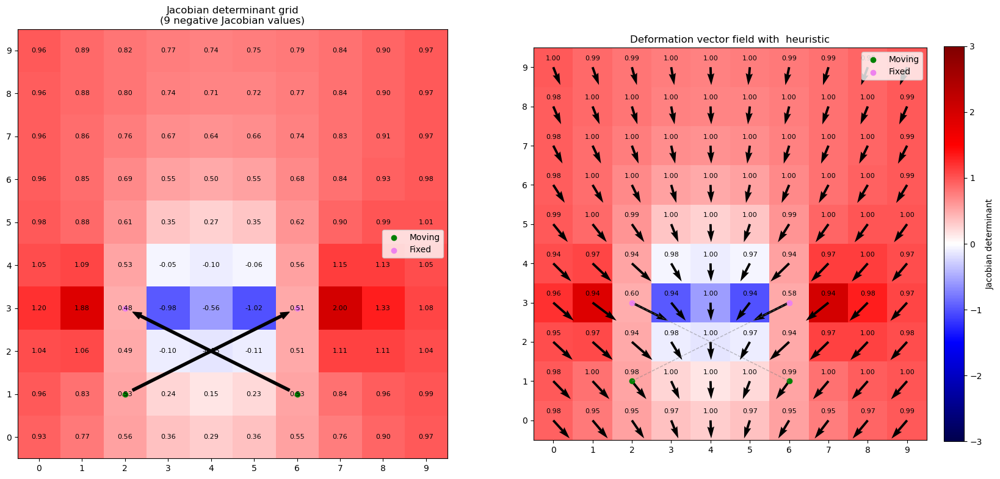

Iteration 16


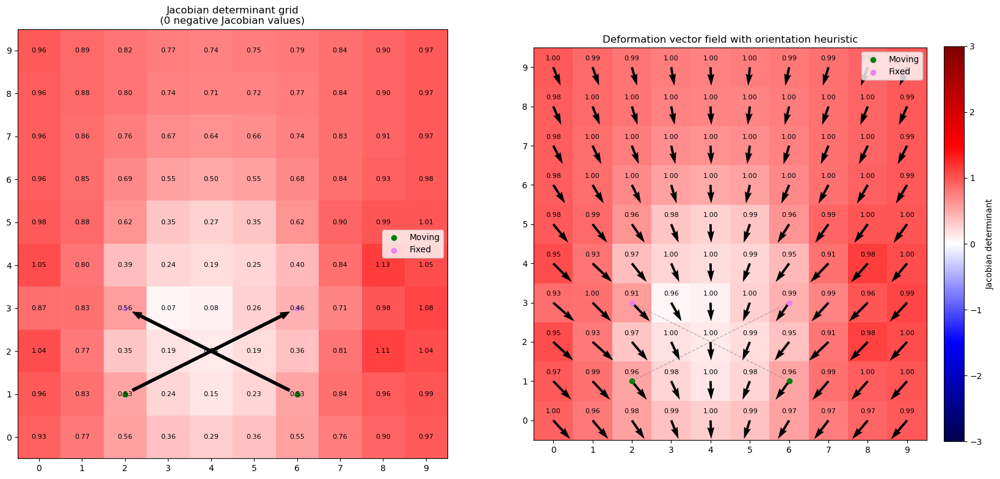

L1 error between original and modified deformation: 10.84625309835101
L2 error between original and modified deformation: 3.8078271730351148


In [5]:
title = "orientation"

smoothness = smoothness_heuristic(deformation)
min_smoothness_coords = min_coords(smoothness)

print("Smoothness:")
pprint(smoothness)
print(f"Minimum smoothness value at coordinates: {min_smoothness_coords}")
print(f"Average vector at these coordinates: {get_3x3_vector_patch(deformation, *min_smoothness_coords)[1]}")
plot_deformation(msample, fsample, deformation)

# Replace the vector at the minimum smoothness coordinates with the average vector
deformation_modified = deformation.copy()
i = 0
while np.sum(jacobian.sitk_jacobian_determinant(deformation_modified) <= 0) > 0:
    
    deformation_modified = replace_lowest_smoothness(deformation_modified, heuristic_func=orientation_heuristic)
    
    # Print the iteration number and plot the deformation 
    # if it's the first iteration or if there are no negative Jacobian values
    if np.sum(jacobian.sitk_jacobian_determinant(deformation_modified) <= 0) == 0:
        print(f"Iteration {i+1}")
        plot_deformation(msample, fsample, deformation_modified, title=title, show_values=show_values, show_points=show_points)
    i += 1
    
# Compare error difference between original and modified deformation vector fields
# L1 error between original and modified deformation
print(f"L1 error between original and modified deformation: {l1_error(deformation, deformation_modified)}")

# L2 error between original and modified deformation
print(f"L2 error between original and modified deformation: {l2_error(deformation, deformation_modified)}")

### Magnitude heuristic

Smoothness:
array([[0.98132285, 0.94542769, 0.94980802, 0.97032325, 0.99939418, 0.97000401, 0.94809725, 0.94712999, 0.97038452, 0.98656407],
       [0.98282733, 0.99621592, 0.98462181, 0.99819581, 0.9994588 , 0.99715537, 0.98534886, 0.99587033, 0.99706678, 0.99829362],
       [0.94840323, 0.97254065, 0.93798672, 0.97508384, 0.99975744, 0.97409231, 0.93551463, 0.97078446, 0.99579279, 0.97668502],
       [0.9552353 , 0.93915769, 0.60061951, 0.94332134, 0.9999165 , 0.94170086, 0.58123006, 0.9366937 , 0.98453414, 0.97166851],
       [0.94311528, 0.97219219, 0.93777722, 0.97549689, 0.99971823, 0.97491437, 0.93520282, 0.97080687, 0.99598409, 0.97411192],
       [0.99273116, 0.99579621, 0.98590652, 0.99807645, 0.99965428, 0.99806006, 0.98612845, 0.99601102, 0.99743268, 0.99688963],
       [0.97914758, 0.99996403, 0.99622798, 0.99952434, 0.99984207, 0.99988663, 0.99672901, 0.99980995, 0.99897952, 0.99124604],
       [0.98045424, 0.9997369 , 0.99880017, 0.99946651, 0.99984317, 0.99977518, 0.999

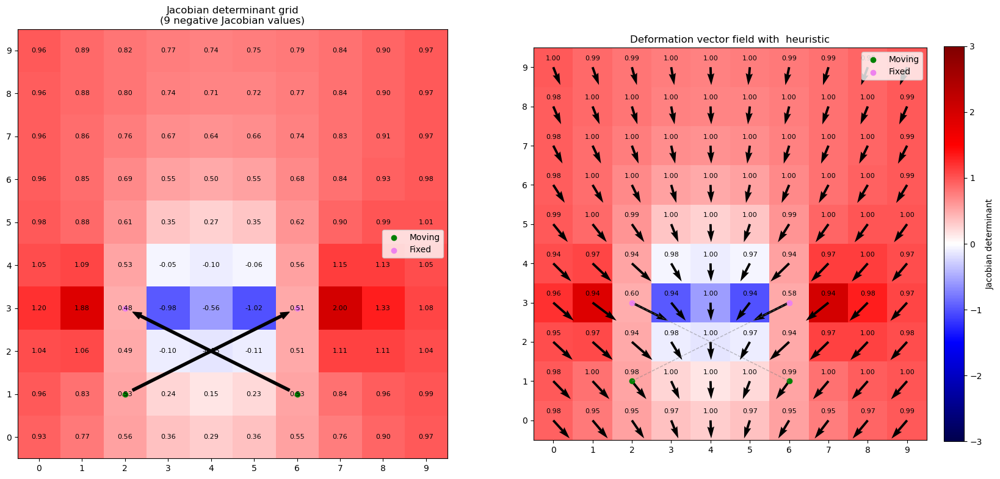

Iteration 23


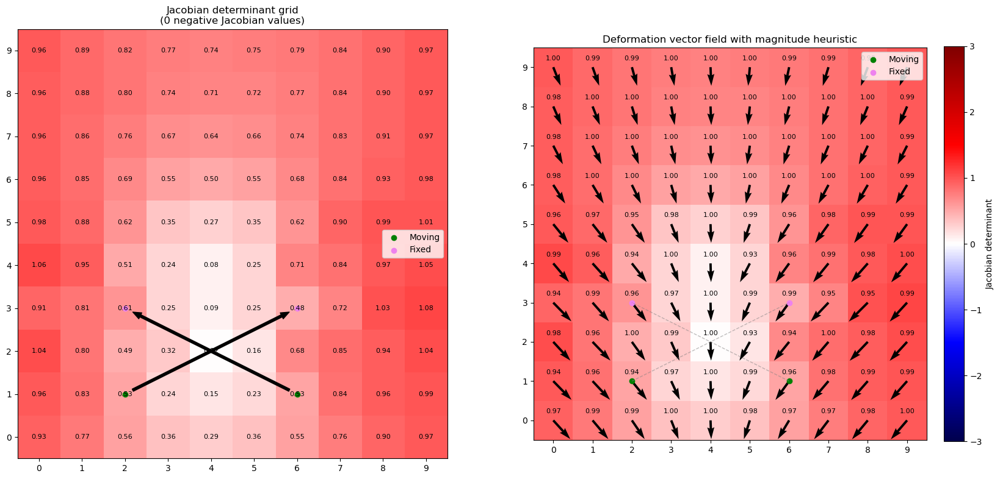

L1 error between original and modified deformation: 13.299319358881563
L2 error between original and modified deformation: 4.137277457448571


In [6]:
title = "magnitude"

smoothness = smoothness_heuristic(deformation)
min_smoothness_coords = min_coords(smoothness)

print("Smoothness:")
pprint(smoothness)
print(f"Minimum smoothness value at coordinates: {min_smoothness_coords}")
print(f"Average vector at these coordinates: {get_3x3_vector_patch(deformation, *min_smoothness_coords)[1]}")
plot_deformation(msample, fsample, deformation)

# Replace the vector at the minimum smoothness coordinates with the average vector
deformation_modified = deformation.copy()
i = 0
while np.sum(jacobian.sitk_jacobian_determinant(deformation_modified) <= 0) > 0:
    deformation_modified = replace_lowest_smoothness(deformation_modified, heuristic_func=magnitude_heuristic)
    
    # Print the iteration number and plot the deformation 
    # if it's the first iteration or if there are no negative Jacobian values
    if np.sum(jacobian.sitk_jacobian_determinant(deformation_modified) <= 0) == 0:
        print(f"Iteration {i+1}")
        plot_deformation(msample, fsample, deformation_modified, title=title, show_values=show_values, show_points=show_points)
    i += 1
    
# Compare error difference between original and modified deformation vector fields
# L1 error between original and modified deformation
print(f"L1 error between original and modified deformation: {l1_error(deformation, deformation_modified)}")

# L2 error between original and modified deformation
print(f"L2 error between original and modified deformation: {l2_error(deformation, deformation_modified)}")

### Combined

Smoothness:
array([[0.98132285, 0.94542769, 0.94980802, 0.97032325, 0.99939418, 0.97000401, 0.94809725, 0.94712999, 0.97038452, 0.98656407],
       [0.98282733, 0.99621592, 0.98462181, 0.99819581, 0.9994588 , 0.99715537, 0.98534886, 0.99587033, 0.99706678, 0.99829362],
       [0.94840323, 0.97254065, 0.93798672, 0.97508384, 0.99975744, 0.97409231, 0.93551463, 0.97078446, 0.99579279, 0.97668502],
       [0.9552353 , 0.93915769, 0.60061951, 0.94332134, 0.9999165 , 0.94170086, 0.58123006, 0.9366937 , 0.98453414, 0.97166851],
       [0.94311528, 0.97219219, 0.93777722, 0.97549689, 0.99971823, 0.97491437, 0.93520282, 0.97080687, 0.99598409, 0.97411192],
       [0.99273116, 0.99579621, 0.98590652, 0.99807645, 0.99965428, 0.99806006, 0.98612845, 0.99601102, 0.99743268, 0.99688963],
       [0.97914758, 0.99996403, 0.99622798, 0.99952434, 0.99984207, 0.99988663, 0.99672901, 0.99980995, 0.99897952, 0.99124604],
       [0.98045424, 0.9997369 , 0.99880017, 0.99946651, 0.99984317, 0.99977518, 0.999

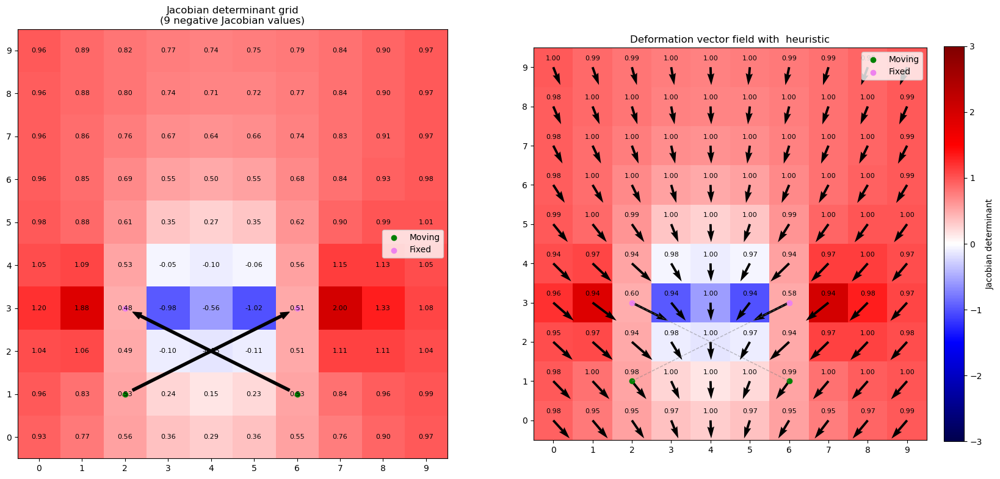

Iteration 23


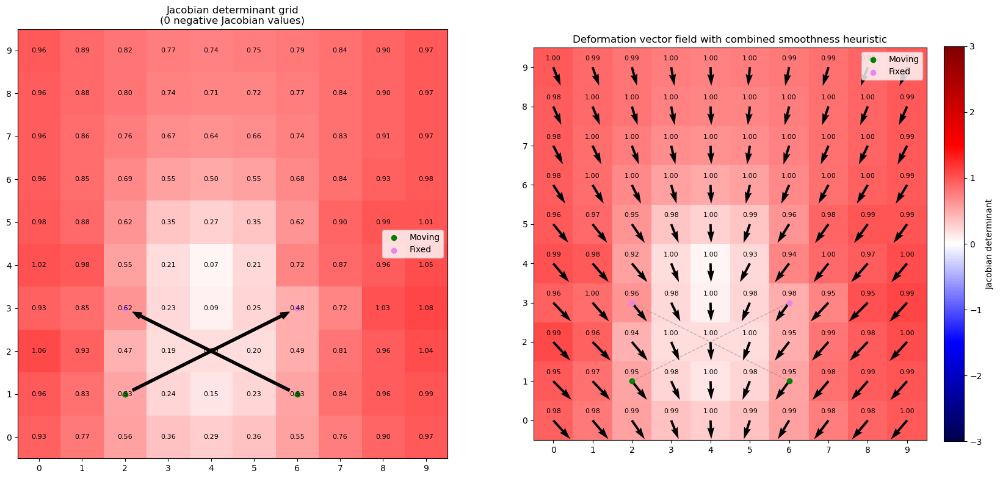

L1 error between original and modified deformation: 13.386372571005618
L2 error between original and modified deformation: 4.084784444787151


In [7]:
title= "combined smoothness"

smoothness = smoothness_heuristic(deformation)
min_smoothness_coords = min_coords(smoothness)

print("Smoothness:")
pprint(smoothness)
print(f"Minimum smoothness value at coordinates: {min_smoothness_coords}")
print(f"Average vector at these coordinates: {get_3x3_vector_patch(deformation, *min_smoothness_coords)[1]}")
plot_deformation(msample, fsample, deformation)

# Replace the vector at the minimum smoothness coordinates with the average vector
deformation_modified = deformation.copy()
i = 0
while np.sum(jacobian.sitk_jacobian_determinant(deformation_modified) <= 0) > 0:
    deformation_modified = replace_lowest_smoothness(deformation_modified, heuristic_func=smoothness_heuristic)
    
    # Print the iteration number and plot the deformation 
    # if it's the first iteration or if there are no negative Jacobian values
    if np.sum(jacobian.sitk_jacobian_determinant(deformation_modified) <= 0) == 0:
        print(f"Iteration {i+1}")
        plot_deformation(msample, fsample, deformation_modified, title=title, show_values=show_values, show_points=show_points)
    i += 1
    
# Compare error difference between original and modified deformation vector fields
# L1 error between original and modified deformation
print(f"L1 error between original and modified deformation: {l1_error(deformation, deformation_modified)}")

# L2 error between original and modified deformation
print(f"L2 error between original and modified deformation: {l2_error(deformation, deformation_modified)}")

## Run smoothness heuristic with correction 2

### Input parameters

In [8]:
msample = np.array([
    [0, 1, 2],
    [0, 1, 6],
    [0, 8, 4],
    [0, 4, 9]
])
fsample = np.array([
    [0, 3, 6],
    [0, 3, 2],
    [0, 6, 4],
    [0, 4, 7]
])

fixed_sample = np.zeros((1, 10, 10))

deformation, A, Zd, Yd, Xd = laplacian.sliceToSlice3DLaplacian(fixed_sample, msample, fsample)

show_points = True
show_values = True

### Orientation

Smoothness:
array([[0.97283681, 0.93248451, 0.93261562, 0.94693712, 0.99049054, 0.95635119, 0.91512462, 0.91839693, 0.98260545, 0.9467823 ],
       [0.9885668 , 0.99399118, 0.97494165, 0.99334688, 0.99443039, 0.98969558, 0.94583771, 0.97417787, 0.98789325, 0.88322623],
       [0.91857695, 0.96236526, 0.91542053, 0.95007265, 0.98924027, 0.9111159 , 0.80148713, 0.85896671, 0.99163095, 0.82273277],
       [0.93155509, 0.91853382, 0.54149861, 0.89725096, 0.9822945 , 0.76702824, 0.19451437, 0.86779377, 0.90169661, 0.92728603],
       [0.91147742, 0.95755559, 0.89880772, 0.94234854, 0.9589389 , 0.7358299 , 0.80393951, 0.07700905, 0.69886562, 0.90759816],
       [0.97566544, 0.99201501, 0.95951273, 0.98532544, 0.87606037, 0.86091175, 0.51607741, 0.67606206, 0.87659047, 0.70507952],
       [0.93293952, 0.99638435, 0.99421273, 0.9344543 , 0.35299309, 0.84548586, 0.95810681, 0.90341032, 0.97926934, 0.90523601],
       [0.93439697, 0.99836677, 0.99480771, 0.96872077, 0.88824465, 0.93751948, 0.979

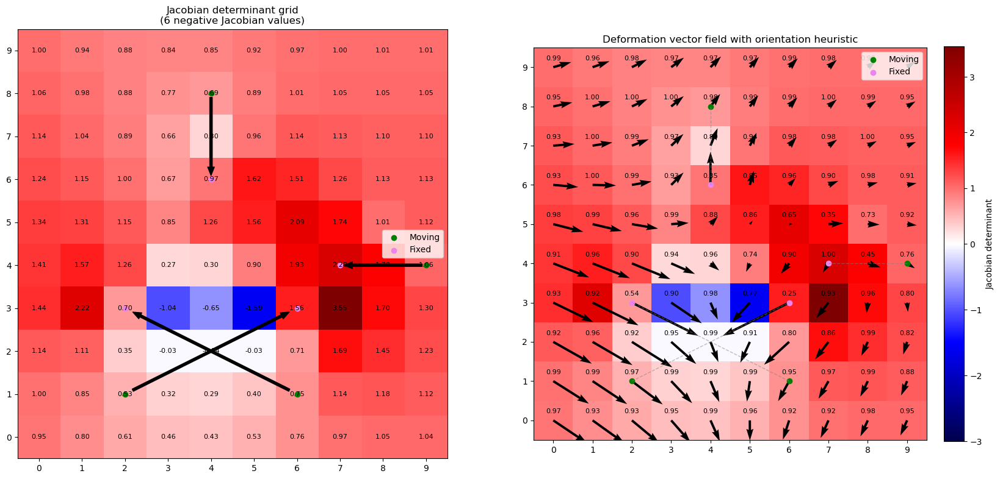

Iteration 2503


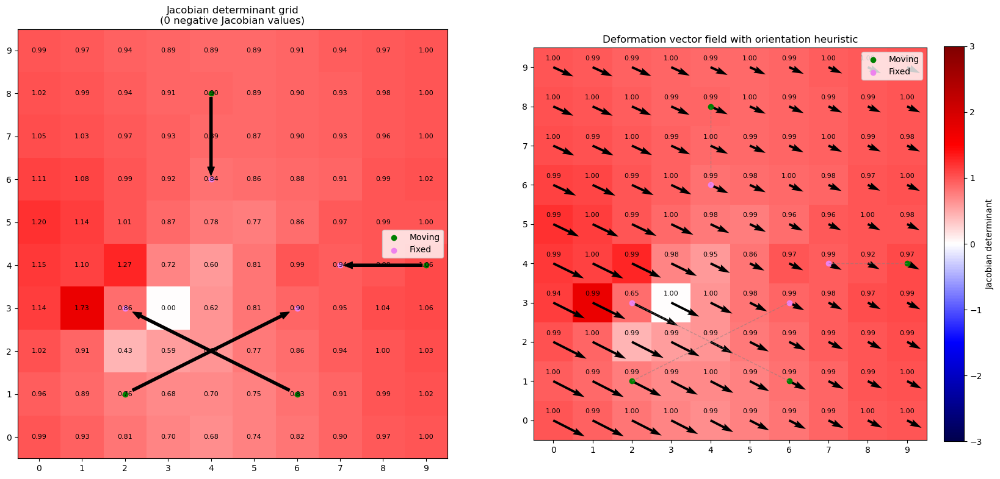

L1 error between original and modified deformation: 165.2811381287876
L2 error between original and modified deformation: 14.743228935623959


In [9]:
title = "orientation"

smoothness = smoothness_heuristic(deformation)
min_smoothness_coords = min_coords(smoothness)

print("Smoothness:")
pprint(smoothness)
print(f"Minimum smoothness value at coordinates: {min_smoothness_coords}")
print(f"Average vector at these coordinates: {get_3x3_vector_patch(deformation, *min_smoothness_coords)[1]}")
#plot_deformation(msample, fsample, deformation)

# Replace the vector at the minimum smoothness coordinates with the average vector
deformation_modified = deformation.copy()
i = 0
while np.sum(jacobian.sitk_jacobian_determinant(deformation_modified) <= 0) > 0:
    deformation_modified = replace_lowest_smoothness(deformation_modified, heuristic_func=orientation_heuristic)
    
    # Print the iteration number and plot the deformation 
    # if it's the first iteration or if there are no negative Jacobian values
    if i == 0 or np.sum(jacobian.sitk_jacobian_determinant(deformation_modified) <= 0) == 0:
        print(f"Iteration {i+1}")
        plot_deformation(msample, fsample, deformation_modified, title=title, show_values=show_values, show_points=show_points)
    i += 1
    
# Compare error difference between original and modified deformation vector fields
# L1 error between original and modified deformation
print(f"L1 error between original and modified deformation: {l1_error(deformation, deformation_modified)}")

# L2 error between original and modified deformation
print(f"L2 error between original and modified deformation: {l2_error(deformation, deformation_modified)}")

### Magnitude heuristic

Smoothness:
array([[0.97283681, 0.93248451, 0.93261562, 0.94693712, 0.99049054, 0.95635119, 0.91512462, 0.91839693, 0.98260545, 0.9467823 ],
       [0.9885668 , 0.99399118, 0.97494165, 0.99334688, 0.99443039, 0.98969558, 0.94583771, 0.97417787, 0.98789325, 0.88322623],
       [0.91857695, 0.96236526, 0.91542053, 0.95007265, 0.98924027, 0.9111159 , 0.80148713, 0.85896671, 0.99163095, 0.82273277],
       [0.93155509, 0.91853382, 0.54149861, 0.89725096, 0.9822945 , 0.76702824, 0.19451437, 0.86779377, 0.90169661, 0.92728603],
       [0.91147742, 0.95755559, 0.89880772, 0.94234854, 0.9589389 , 0.7358299 , 0.80393951, 0.07700905, 0.69886562, 0.90759816],
       [0.97566544, 0.99201501, 0.95951273, 0.98532544, 0.87606037, 0.86091175, 0.51607741, 0.67606206, 0.87659047, 0.70507952],
       [0.93293952, 0.99638435, 0.99421273, 0.9344543 , 0.35299309, 0.84548586, 0.95810681, 0.90341032, 0.97926934, 0.90523601],
       [0.93439697, 0.99836677, 0.99480771, 0.96872077, 0.88824465, 0.93751948, 0.979

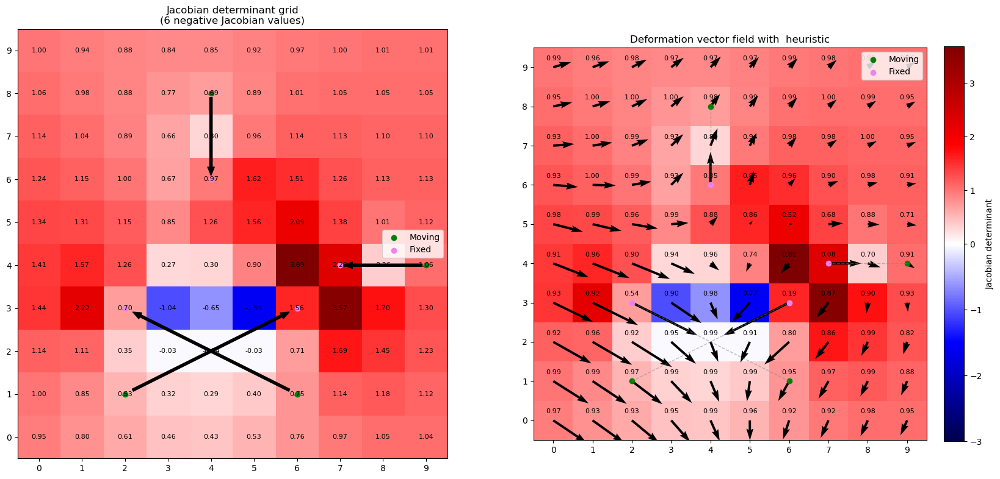

Iteration 26


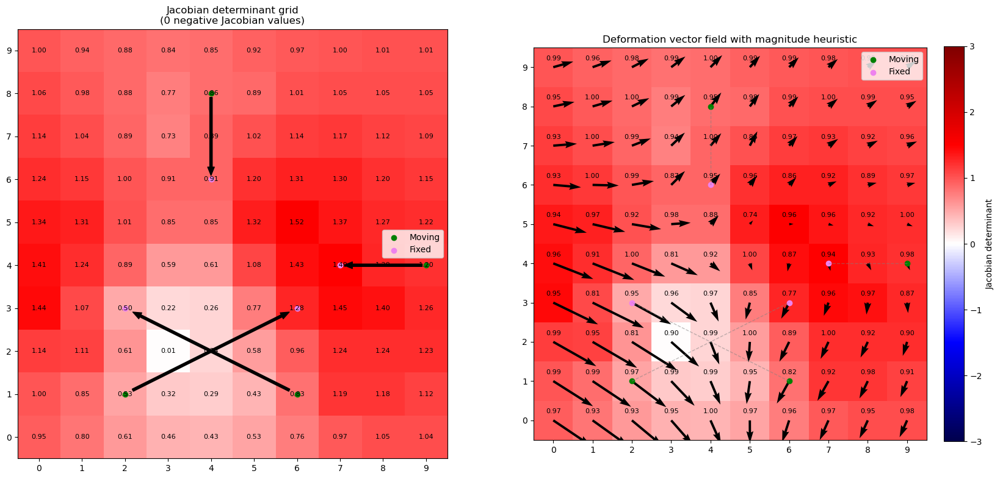

L1 error between original and modified deformation: 22.589464813840415
L2 error between original and modified deformation: 5.402322089155279


In [10]:
title = "magnitude"

smoothness = smoothness_heuristic(deformation)
min_smoothness_coords = min_coords(smoothness)

print("Smoothness:")
pprint(smoothness)
print(f"Minimum smoothness value at coordinates: {min_smoothness_coords}")
print(f"Average vector at these coordinates: {get_3x3_vector_patch(deformation, *min_smoothness_coords)[1]}")
plot_deformation(msample, fsample, deformation)

# Replace the vector at the minimum smoothness coordinates with the average vector
deformation_modified = deformation.copy()
i = 0
while np.sum(jacobian.sitk_jacobian_determinant(deformation_modified) <= 0) > 0:
    deformation_modified = replace_lowest_smoothness(deformation_modified, heuristic_func=magnitude_heuristic)
    
    # Print the iteration number and plot the deformation 
    # if it's the first iteration or if there are no negative Jacobian values
    if np.sum(jacobian.sitk_jacobian_determinant(deformation_modified) <= 0) == 0:
        print(f"Iteration {i+1}")
        plot_deformation(msample, fsample, deformation_modified, title=title, show_values=show_values, show_points=show_points)
    i += 1
    
# Compare error difference between original and modified deformation vector fields
# L1 error between original and modified deformation
print(f"L1 error between original and modified deformation: {l1_error(deformation, deformation_modified)}")

# L2 error between original and modified deformation
print(f"L2 error between original and modified deformation: {l2_error(deformation, deformation_modified)}")

### Combined

Smoothness:
array([[0.97283681, 0.93248451, 0.93261562, 0.94693712, 0.99049054, 0.95635119, 0.91512462, 0.91839693, 0.98260545, 0.9467823 ],
       [0.9885668 , 0.99399118, 0.97494165, 0.99334688, 0.99443039, 0.98969558, 0.94583771, 0.97417787, 0.98789325, 0.88322623],
       [0.91857695, 0.96236526, 0.91542053, 0.95007265, 0.98924027, 0.9111159 , 0.80148713, 0.85896671, 0.99163095, 0.82273277],
       [0.93155509, 0.91853382, 0.54149861, 0.89725096, 0.9822945 , 0.76702824, 0.19451437, 0.86779377, 0.90169661, 0.92728603],
       [0.91147742, 0.95755559, 0.89880772, 0.94234854, 0.9589389 , 0.7358299 , 0.80393951, 0.07700905, 0.69886562, 0.90759816],
       [0.97566544, 0.99201501, 0.95951273, 0.98532544, 0.87606037, 0.86091175, 0.51607741, 0.67606206, 0.87659047, 0.70507952],
       [0.93293952, 0.99638435, 0.99421273, 0.9344543 , 0.35299309, 0.84548586, 0.95810681, 0.90341032, 0.97926934, 0.90523601],
       [0.93439697, 0.99836677, 0.99480771, 0.96872077, 0.88824465, 0.93751948, 0.979

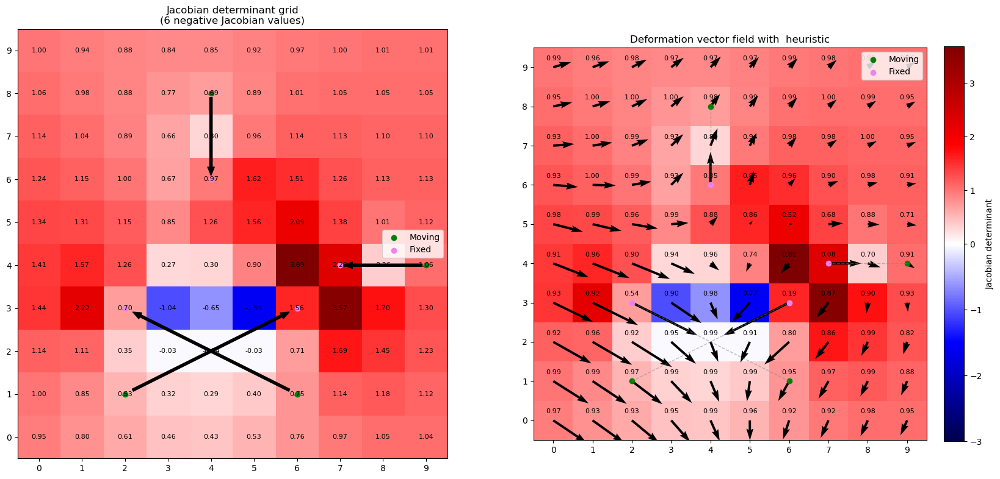

Iteration 33


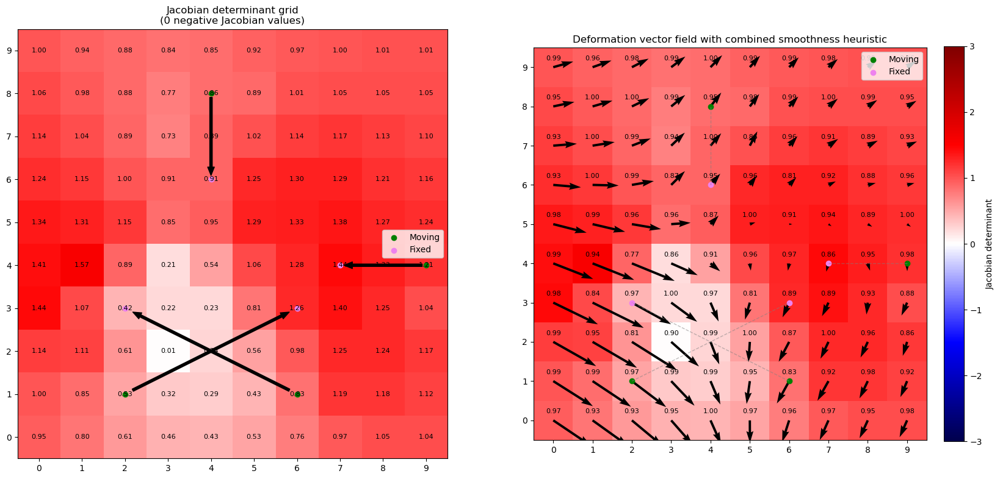

L1 error between original and modified deformation: 23.61989458456228
L2 error between original and modified deformation: 5.565401293732449


In [11]:
title = "combined smoothness"

smoothness = smoothness_heuristic(deformation)
min_smoothness_coords = min_coords(smoothness)

print("Smoothness:")
pprint(smoothness)
print(f"Minimum smoothness value at coordinates: {min_smoothness_coords}")
print(f"Average vector at these coordinates: {get_3x3_vector_patch(deformation, *min_smoothness_coords)[1]}")
plot_deformation(msample, fsample, deformation)

# Replace the vector at the minimum smoothness coordinates with the average vector
deformation_modified = deformation.copy()
i = 0
while np.sum(jacobian.sitk_jacobian_determinant(deformation_modified) <= 0) > 0:
    deformation_modified = replace_lowest_smoothness(deformation_modified, heuristic_func=smoothness_heuristic)
    
    # Print the iteration number and plot the deformation 
    # if it's the first iteration or if there are no negative Jacobian values
    if np.sum(jacobian.sitk_jacobian_determinant(deformation_modified) <= 0) == 0:
        print(f"Iteration {i+1}")
        plot_deformation(msample, fsample, deformation_modified, title=title, show_values=show_values, show_points=show_points)
    i += 1
    
# Compare error difference between original and modified deformation vector fields
# L1 error between original and modified deformation
print(f"L1 error between original and modified deformation: {l1_error(deformation, deformation_modified)}")

# L2 error between original and modified deformation
print(f"L2 error between original and modified deformation: {l2_error(deformation, deformation_modified)}")

Test

In [12]:
import numpy as np
center_vec = np.array([1.0, 0.0, 0.0])  # unit vector along x-axis
test_vectors = {
    "Aligned":             np.array([2.0, 0.0, 0.0]),    # same direction, longer
    "Opposite":            np.array([-1.0, 0.0, 0.0]),   # 180° opposite
    "Orthogonal Y":        np.array([0.0, 1.0, 0.0]),    # 90° in y-axis
    "Orthogonal Z":        np.array([0.0, 0.0, 1.0]),    # 90° in z-axis
    "45 Degrees":          np.array([1.0, 1.0, 0.0]),    # 45° in xy plane
    "135 Degrees":         np.array([-1.0, 1.0, 0.0]),   # 135° in xy plane
    "Small magnitude":     np.array([0.001, 0.0, 0.0]),  # tiny but aligned
    "Zero vector":         np.array([0.0, 0.0, 0.0]),    # degenerate case
}

avg_vec = test_vectors["Opposite"]  # Example average vector for testing

# Normalize both vectors
norm_center = np.linalg.norm(center_vec)
norm_avg = np.linalg.norm(avg_vec)

# Compute dot product if both norms are non-zero
if norm_center > 0 and norm_avg > 0:
    angle = np.dot(center_vec / norm_center, avg_vec / norm_avg)
else:
    angle = 0.0
    
print(angle)
            

-1.0


## Run smoothness heuristic with correction 3a

### Input parameters

In [13]:
msample = np.array([
    [0, 2, 0],
    [0, 3, 1],
    [0, 10, 7],
    [0, 13, 1],
    [0, 2, 39],
    [0, 3, 38],
    [0, 10, 32],
    [0, 13, 39],
])
fsample = np.array([
    [0, 2, 4],
    [0, 3, 2],
    [0, 10, 3],
    [0, 11, 6],
    [0, 2, 30],
    [0, 3, 36],
    [0, 10, 37],
    [0, 11, 34]
])
    
fixed_sample = np.zeros((1, 20, 40))

deformation, A, Zd, Yd, Xd = laplacian.sliceToSlice3DLaplacian(fixed_sample, msample, fsample)

show_points = False
show_values = False

### Orientation

Smoothness:
array([[0.99656259, 0.93695614, 0.97513488, 0.93520376, 0.93583878, 0.9159548 , 0.98354164, 0.99302702, 0.98769298, 0.98898134, 0.99276151, 0.99788207, 0.99725232, 0.9912402 , 0.98585588, 0.98923269, 0.99822122, 0.99547058, 0.99315276, 0.9917766 , 0.99043191, 0.98890956, 0.98787337, 0.98675107, 0.98531407, 0.98498456, 0.98676583, 0.99401336, 0.98403896, 0.9256594 , 0.93593997, 0.92584231, 0.98638735, 0.98819481, 0.97519164, 0.96415525, 0.95716046, 0.95257618, 0.9539294 , 0.99849669],
       [0.93836909, 0.99793662, 0.9870162 , 0.96988212, 0.93464891, 0.96986065, 0.99483711, 0.99993304, 0.99902582, 0.99881842, 0.9988319 , 0.99919276, 0.99898876, 0.99990217, 0.99879886, 0.99839587, 0.99871847, 0.99866329, 0.99850696, 0.99806116, 0.9981034 , 0.9986809 , 0.99877018, 0.99911328, 0.99957974, 0.99976439, 0.99964026, 0.99909049, 0.99533337, 0.97530901, 0.94840213, 0.9750246 , 0.99531066, 0.99932354, 0.99986938, 0.99954329, 0.99687044, 0.99997381, 0.99908548, 0.95235328],
       [0.

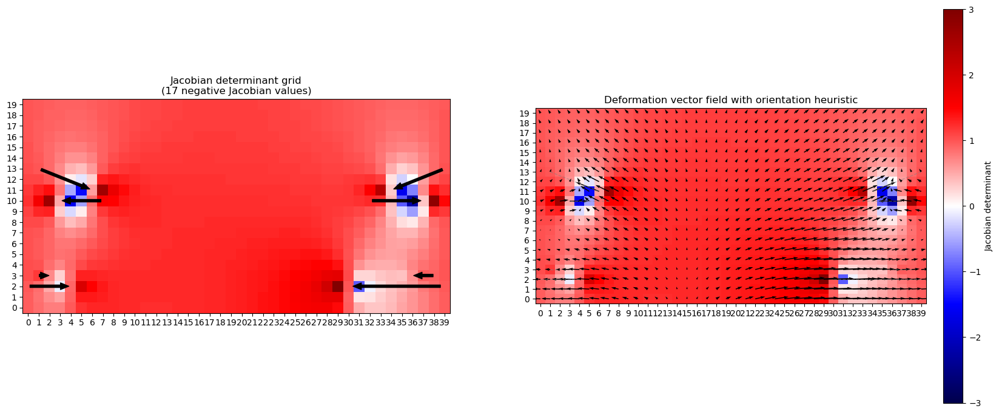

Iteration 1847


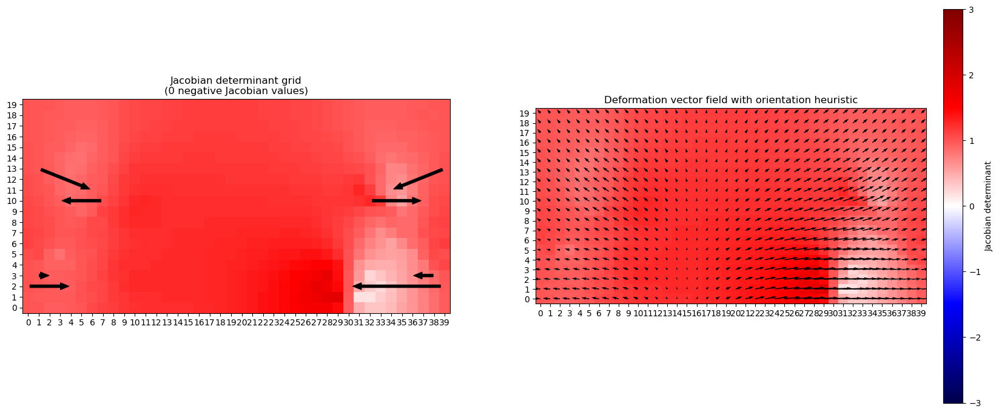

L1 error between original and modified deformation: 226.22742688568667
L2 error between original and modified deformation: 19.097338953795077


In [14]:
title = "orientation"

smoothness = smoothness_heuristic(deformation)
min_smoothness_coords = min_coords(smoothness)

print("Smoothness:")
pprint(smoothness)
print(f"Minimum smoothness value at coordinates: {min_smoothness_coords}")
print(f"Average vector at these coordinates: {get_3x3_vector_patch(deformation, *min_smoothness_coords)[1]}")
plot_deformation(msample, fsample, deformation, title=title, show_values=show_values, show_points=show_points)

# Replace the vector at the minimum smoothness coordinates with the average vector
deformation_modified = deformation.copy()
i = 0
while np.sum(jacobian.sitk_jacobian_determinant(deformation_modified) <= 0) > 0:
    deformation_modified = replace_lowest_smoothness(deformation_modified, heuristic_func=orientation_heuristic)
    
    # Print the iteration number and plot the deformation 
    # if it's the first iteration or if there are no negative Jacobian values
    if np.sum(jacobian.sitk_jacobian_determinant(deformation_modified) <= 0) == 0:
        print(f"Iteration {i+1}")
        plot_deformation(msample, fsample, deformation_modified, title=title, show_values=show_values, show_points=show_points)
    i += 1
    
# Compare error difference between original and modified deformation vector fields
# L1 error between original and modified deformation
print(f"L1 error between original and modified deformation: {l1_error(deformation, deformation_modified)}")

# L2 error between original and modified deformation
print(f"L2 error between original and modified deformation: {l2_error(deformation, deformation_modified)}")

### Magnitude heuristic

Smoothness:
array([[0.99656259, 0.93695614, 0.97513488, 0.93520376, 0.93583878, 0.9159548 , 0.98354164, 0.99302702, 0.98769298, 0.98898134, 0.99276151, 0.99788207, 0.99725232, 0.9912402 , 0.98585588, 0.98923269, 0.99822122, 0.99547058, 0.99315276, 0.9917766 , 0.99043191, 0.98890956, 0.98787337, 0.98675107, 0.98531407, 0.98498456, 0.98676583, 0.99401336, 0.98403896, 0.9256594 , 0.93593997, 0.92584231, 0.98638735, 0.98819481, 0.97519164, 0.96415525, 0.95716046, 0.95257618, 0.9539294 , 0.99849669],
       [0.93836909, 0.99793662, 0.9870162 , 0.96988212, 0.93464891, 0.96986065, 0.99483711, 0.99993304, 0.99902582, 0.99881842, 0.9988319 , 0.99919276, 0.99898876, 0.99990217, 0.99879886, 0.99839587, 0.99871847, 0.99866329, 0.99850696, 0.99806116, 0.9981034 , 0.9986809 , 0.99877018, 0.99911328, 0.99957974, 0.99976439, 0.99964026, 0.99909049, 0.99533337, 0.97530901, 0.94840213, 0.9750246 , 0.99531066, 0.99932354, 0.99986938, 0.99954329, 0.99687044, 0.99997381, 0.99908548, 0.95235328],
       [0.

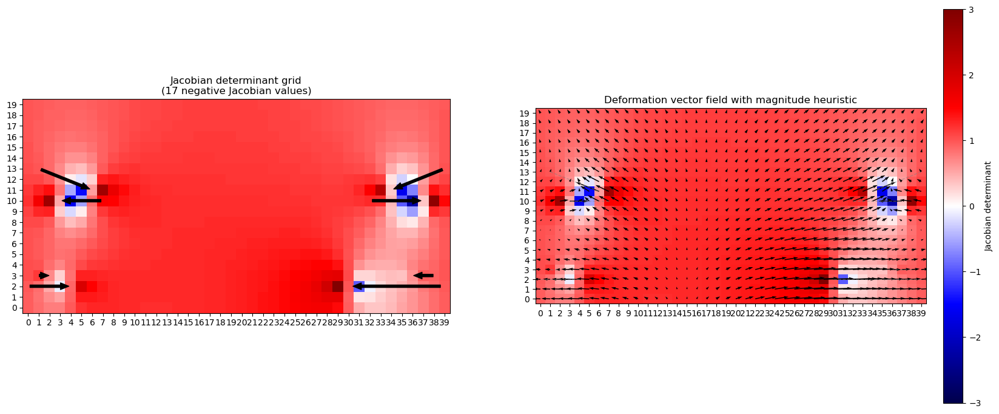

Iteration 140


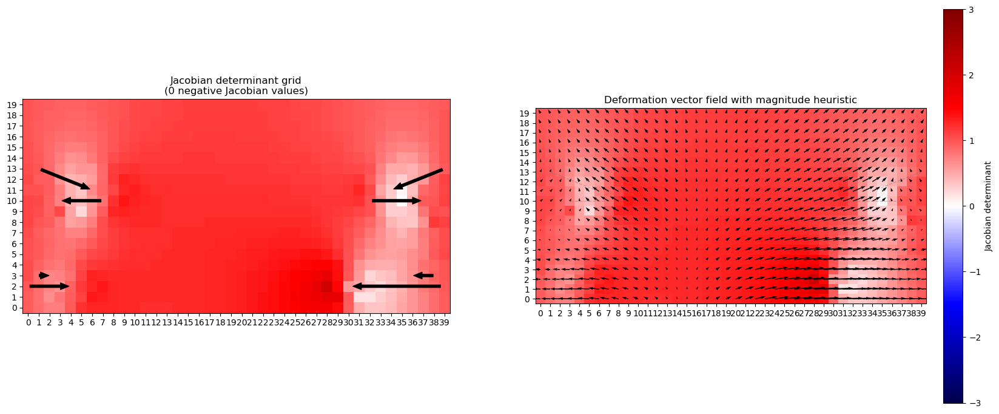

L1 error between original and modified deformation: 75.53904026577376
L2 error between original and modified deformation: 10.632115984712854


In [15]:
title = "magnitude"

smoothness = smoothness_heuristic(deformation)
min_smoothness_coords = min_coords(smoothness)

print("Smoothness:")
pprint(smoothness)
print(f"Minimum smoothness value at coordinates: {min_smoothness_coords}")
print(f"Average vector at these coordinates: {get_3x3_vector_patch(deformation, *min_smoothness_coords)[1]}")
plot_deformation(msample, fsample, deformation, title=title, show_values=show_values, show_points=show_points)

# Replace the vector at the minimum smoothness coordinates with the average vector
deformation_modified = deformation.copy()
i = 0
while np.sum(jacobian.sitk_jacobian_determinant(deformation_modified) <= 0) > 0:
    deformation_modified = replace_lowest_smoothness(deformation_modified, heuristic_func=magnitude_heuristic)
    
    # Print the iteration number and plot the deformation 
    # if it's the first iteration or if there are no negative Jacobian values
    if np.sum(jacobian.sitk_jacobian_determinant(deformation_modified) <= 0) == 0:
        print(f"Iteration {i+1}")
        plot_deformation(msample, fsample, deformation_modified, title=title, show_values=show_values, show_points=show_points)
    i += 1
    
# Compare error difference between original and modified deformation vector fields
# L1 error between original and modified deformation
print(f"L1 error between original and modified deformation: {l1_error(deformation, deformation_modified)}")

# L2 error between original and modified deformation
print(f"L2 error between original and modified deformation: {l2_error(deformation, deformation_modified)}")

### Combined

Smoothness:
array([[0.99656259, 0.93695614, 0.97513488, 0.93520376, 0.93583878, 0.9159548 , 0.98354164, 0.99302702, 0.98769298, 0.98898134, 0.99276151, 0.99788207, 0.99725232, 0.9912402 , 0.98585588, 0.98923269, 0.99822122, 0.99547058, 0.99315276, 0.9917766 , 0.99043191, 0.98890956, 0.98787337, 0.98675107, 0.98531407, 0.98498456, 0.98676583, 0.99401336, 0.98403896, 0.9256594 , 0.93593997, 0.92584231, 0.98638735, 0.98819481, 0.97519164, 0.96415525, 0.95716046, 0.95257618, 0.9539294 , 0.99849669],
       [0.93836909, 0.99793662, 0.9870162 , 0.96988212, 0.93464891, 0.96986065, 0.99483711, 0.99993304, 0.99902582, 0.99881842, 0.9988319 , 0.99919276, 0.99898876, 0.99990217, 0.99879886, 0.99839587, 0.99871847, 0.99866329, 0.99850696, 0.99806116, 0.9981034 , 0.9986809 , 0.99877018, 0.99911328, 0.99957974, 0.99976439, 0.99964026, 0.99909049, 0.99533337, 0.97530901, 0.94840213, 0.9750246 , 0.99531066, 0.99932354, 0.99986938, 0.99954329, 0.99687044, 0.99997381, 0.99908548, 0.95235328],
       [0.

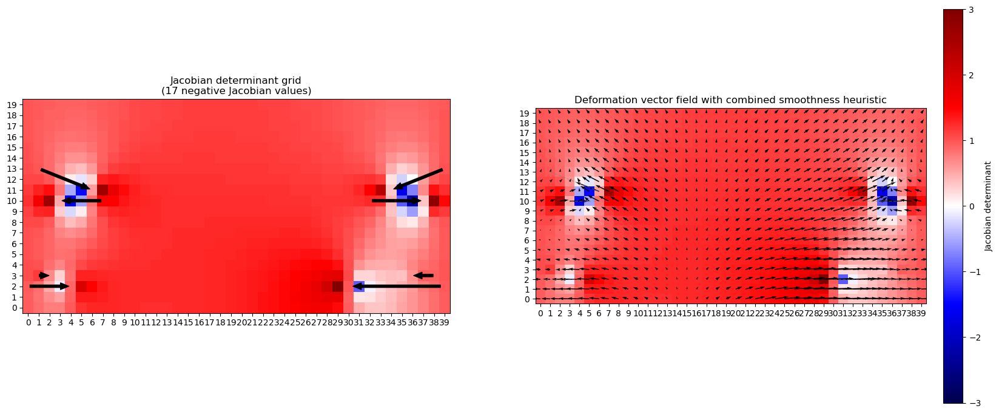

Iteration 173


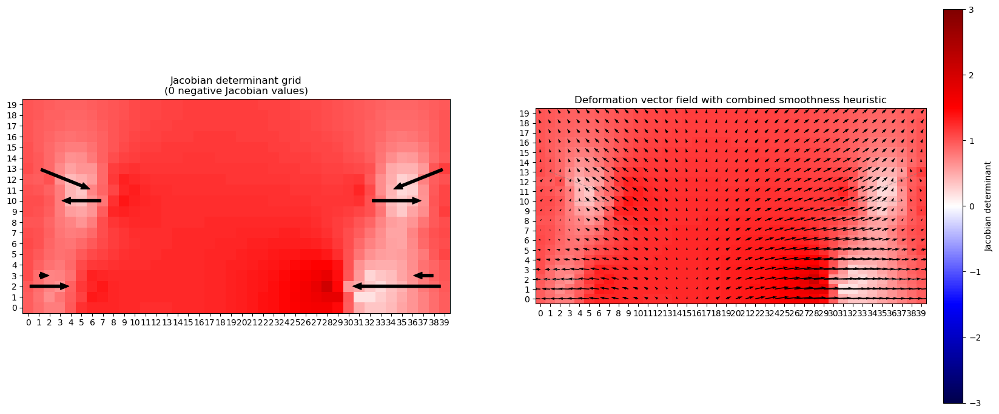

L1 error between original and modified deformation: 84.65625599453723
L2 error between original and modified deformation: 11.147540989442902


In [16]:
title = "combined smoothness"

smoothness = smoothness_heuristic(deformation)
min_smoothness_coords = min_coords(smoothness)

print("Smoothness:")
pprint(smoothness)
print(f"Minimum smoothness value at coordinates: {min_smoothness_coords}")
print(f"Average vector at these coordinates: {get_3x3_vector_patch(deformation, *min_smoothness_coords)[1]}")
plot_deformation(msample, fsample, deformation, title=title, show_values=show_values, show_points=show_points)

# Replace the vector at the minimum smoothness coordinates with the average vector
deformation_modified = deformation.copy()
i = 0
while np.sum(jacobian.sitk_jacobian_determinant(deformation_modified) <= 0) > 0:
    deformation_modified = replace_lowest_smoothness(deformation_modified, heuristic_func=smoothness_heuristic)
    
    # Print the iteration number and plot the deformation 
    # if it's the first iteration or if there are no negative Jacobian values
    if np.sum(jacobian.sitk_jacobian_determinant(deformation_modified) <= 0) == 0:
        print(f"Iteration {i+1}")
        plot_deformation(msample, fsample, deformation_modified, title=title, show_values=show_values, show_points=show_points)
    i += 1
    
# Compare error difference between original and modified deformation vector fields
# L1 error between original and modified deformation
print(f"L1 error between original and modified deformation: {l1_error(deformation, deformation_modified)}")

# L2 error between original and modified deformation
print(f"L2 error between original and modified deformation: {l2_error(deformation, deformation_modified)}")

## Run smoothness heuristic with correction 3b

### Input parameters

In [17]:
msample = np.array([
    [0, 2, 0],
    [0, 3, 1],
    [0, 10, 5],
    [0, 13, 1],
    [0, 2, 39],
    [0, 3, 38],
    [0, 10, 35],
    [0, 13, 39],
])
fsample = np.array([
    [0, 2, 4],
    [0, 3, 2],
    [0, 10, 3],
    [0, 11, 6],
    [0, 2, 30],
    [0, 3, 36],
    [0, 10, 37],
    [0, 11, 34]
])
    
fixed_sample = np.zeros((1, 20, 40))

deformation, A, Zd, Yd, Xd = laplacian.sliceToSlice3DLaplacian(fixed_sample, msample, fsample)

show_points = False
show_values = False

### Orientation

Smoothness:
array([[0.99307365, 0.94215428, 0.97523353, 0.94216303, 0.94049555, 0.92122808, 0.98199638, 0.99793783, 0.99330493, 0.99457046, 0.99730753, 0.99873551, 0.99376431, 0.98891646, 0.98512761, 0.98850704, 0.99740551, 0.99573969, 0.99280495, 0.99128224, 0.9907311 , 0.99014521, 0.98893642, 0.98764654, 0.98672873, 0.98648792, 0.98768527, 0.99429496, 0.98538661, 0.93009466, 0.93955681, 0.92992751, 0.98642551, 0.98995106, 0.97689713, 0.96476666, 0.95923934, 0.95760643, 0.96593721, 0.99952039],
       [0.95187664, 0.99735329, 0.98556281, 0.97232736, 0.93941469, 0.97285648, 0.99565478, 0.99984952, 0.99950642, 0.99977567, 0.99971964, 0.99981404, 0.99956791, 0.99963362, 0.9991694 , 0.99839857, 0.99791415, 0.99774039, 0.99841552, 0.99873853, 0.99900913, 0.99890437, 0.99905439, 0.99941211, 0.99948978, 0.99955172, 0.99983098, 0.99930154, 0.99591644, 0.97695584, 0.95108398, 0.97685332, 0.99580736, 0.99947826, 0.99944916, 0.99914324, 0.99403609, 0.99926881, 0.99968632, 0.96955684],
       [0.

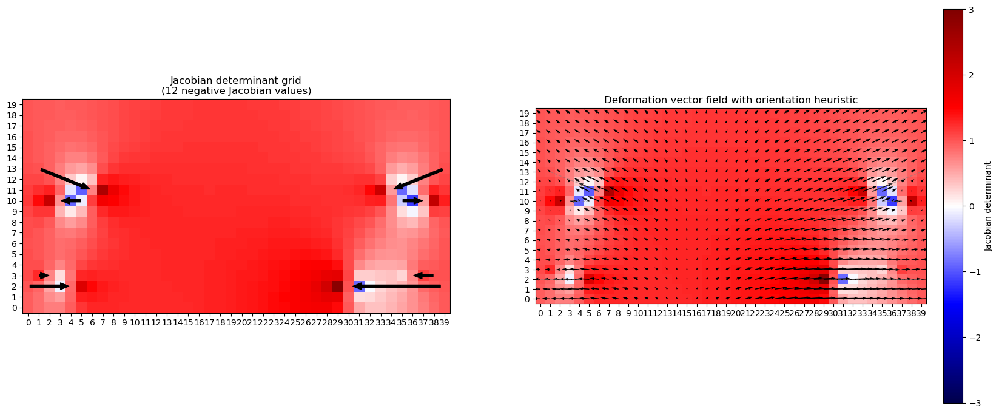

Iteration 1231


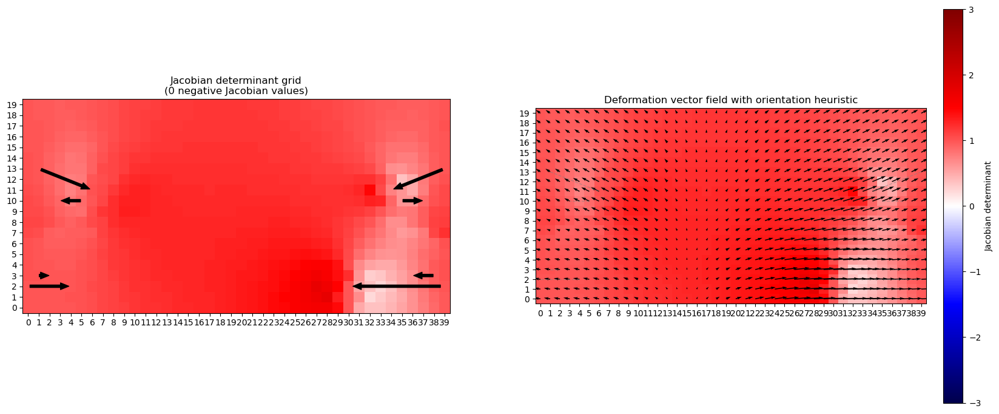

L1 error between original and modified deformation: 138.6205140258675
L2 error between original and modified deformation: 11.786561199491663


In [18]:
title = "orientation"

smoothness = smoothness_heuristic(deformation)
min_smoothness_coords = min_coords(smoothness)

print("Smoothness:")
pprint(smoothness)
print(f"Minimum smoothness value at coordinates: {min_smoothness_coords}")
print(f"Average vector at these coordinates: {get_3x3_vector_patch(deformation, *min_smoothness_coords)[1]}")
plot_deformation(msample, fsample, deformation, title=title, show_values=show_values, show_points=show_points)

# Replace the vector at the minimum smoothness coordinates with the average vector
deformation_modified = deformation.copy()
i = 0
while np.sum(jacobian.sitk_jacobian_determinant(deformation_modified) <= 0) > 0:
    deformation_modified = replace_lowest_smoothness(deformation_modified, heuristic_func=orientation_heuristic)
    
    # Print the iteration number and plot the deformation 
    # if it's the first iteration or if there are no negative Jacobian values
    if np.sum(jacobian.sitk_jacobian_determinant(deformation_modified) <= 0) == 0:
        print(f"Iteration {i+1}")
        plot_deformation(msample, fsample, deformation_modified, title=title, show_values=show_values, show_points=show_points)
    i += 1
    
# Compare error difference between original and modified deformation vector fields
# L1 error between original and modified deformation
print(f"L1 error between original and modified deformation: {l1_error(deformation, deformation_modified)}")

# L2 error between original and modified deformation
print(f"L2 error between original and modified deformation: {l2_error(deformation, deformation_modified)}")

### Magnitude heuristic

Smoothness:
array([[0.99307365, 0.94215428, 0.97523353, 0.94216303, 0.94049555, 0.92122808, 0.98199638, 0.99793783, 0.99330493, 0.99457046, 0.99730753, 0.99873551, 0.99376431, 0.98891646, 0.98512761, 0.98850704, 0.99740551, 0.99573969, 0.99280495, 0.99128224, 0.9907311 , 0.99014521, 0.98893642, 0.98764654, 0.98672873, 0.98648792, 0.98768527, 0.99429496, 0.98538661, 0.93009466, 0.93955681, 0.92992751, 0.98642551, 0.98995106, 0.97689713, 0.96476666, 0.95923934, 0.95760643, 0.96593721, 0.99952039],
       [0.95187664, 0.99735329, 0.98556281, 0.97232736, 0.93941469, 0.97285648, 0.99565478, 0.99984952, 0.99950642, 0.99977567, 0.99971964, 0.99981404, 0.99956791, 0.99963362, 0.9991694 , 0.99839857, 0.99791415, 0.99774039, 0.99841552, 0.99873853, 0.99900913, 0.99890437, 0.99905439, 0.99941211, 0.99948978, 0.99955172, 0.99983098, 0.99930154, 0.99591644, 0.97695584, 0.95108398, 0.97685332, 0.99580736, 0.99947826, 0.99944916, 0.99914324, 0.99403609, 0.99926881, 0.99968632, 0.96955684],
       [0.

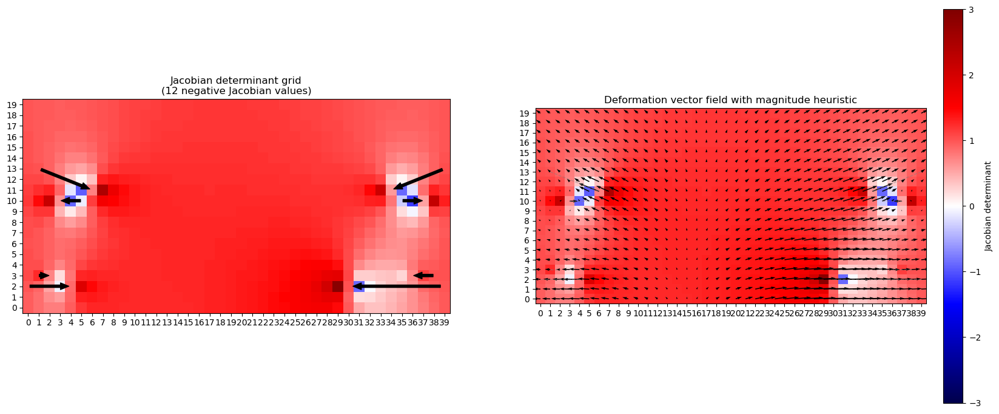

Iteration 112


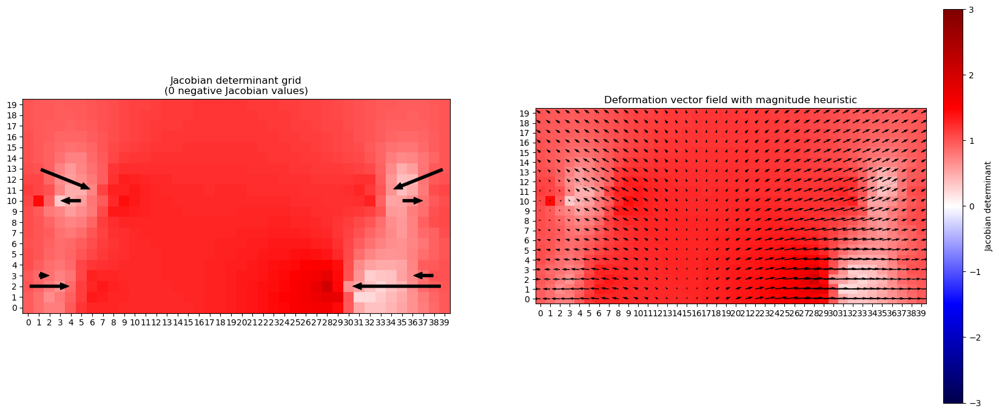

L1 error between original and modified deformation: 55.78009272931199
L2 error between original and modified deformation: 8.015189498284345


In [19]:
title = "magnitude"

smoothness = smoothness_heuristic(deformation)
min_smoothness_coords = min_coords(smoothness)

print("Smoothness:")
pprint(smoothness)
print(f"Minimum smoothness value at coordinates: {min_smoothness_coords}")
print(f"Average vector at these coordinates: {get_3x3_vector_patch(deformation, *min_smoothness_coords)[1]}")
plot_deformation(msample, fsample, deformation, title=title, show_values=show_values, show_points=show_points)

# Replace the vector at the minimum smoothness coordinates with the average vector
deformation_modified = deformation.copy()
i = 0
while np.sum(jacobian.sitk_jacobian_determinant(deformation_modified) <= 0) > 0:
    deformation_modified = replace_lowest_smoothness(deformation_modified, heuristic_func=magnitude_heuristic)
    
    # Print the iteration number and plot the deformation 
    # if it's the first iteration or if there are no negative Jacobian values
    if np.sum(jacobian.sitk_jacobian_determinant(deformation_modified) <= 0) == 0:
        print(f"Iteration {i+1}")
        plot_deformation(msample, fsample, deformation_modified, title=title, show_values=show_values, show_points=show_points)
    i += 1
    
# Compare error difference between original and modified deformation vector fields
# L1 error between original and modified deformation
print(f"L1 error between original and modified deformation: {l1_error(deformation, deformation_modified)}")

# L2 error between original and modified deformation
print(f"L2 error between original and modified deformation: {l2_error(deformation, deformation_modified)}")

### Combined

Smoothness:
array([[0.99307365, 0.94215428, 0.97523353, 0.94216303, 0.94049555, 0.92122808, 0.98199638, 0.99793783, 0.99330493, 0.99457046, 0.99730753, 0.99873551, 0.99376431, 0.98891646, 0.98512761, 0.98850704, 0.99740551, 0.99573969, 0.99280495, 0.99128224, 0.9907311 , 0.99014521, 0.98893642, 0.98764654, 0.98672873, 0.98648792, 0.98768527, 0.99429496, 0.98538661, 0.93009466, 0.93955681, 0.92992751, 0.98642551, 0.98995106, 0.97689713, 0.96476666, 0.95923934, 0.95760643, 0.96593721, 0.99952039],
       [0.95187664, 0.99735329, 0.98556281, 0.97232736, 0.93941469, 0.97285648, 0.99565478, 0.99984952, 0.99950642, 0.99977567, 0.99971964, 0.99981404, 0.99956791, 0.99963362, 0.9991694 , 0.99839857, 0.99791415, 0.99774039, 0.99841552, 0.99873853, 0.99900913, 0.99890437, 0.99905439, 0.99941211, 0.99948978, 0.99955172, 0.99983098, 0.99930154, 0.99591644, 0.97695584, 0.95108398, 0.97685332, 0.99580736, 0.99947826, 0.99944916, 0.99914324, 0.99403609, 0.99926881, 0.99968632, 0.96955684],
       [0.

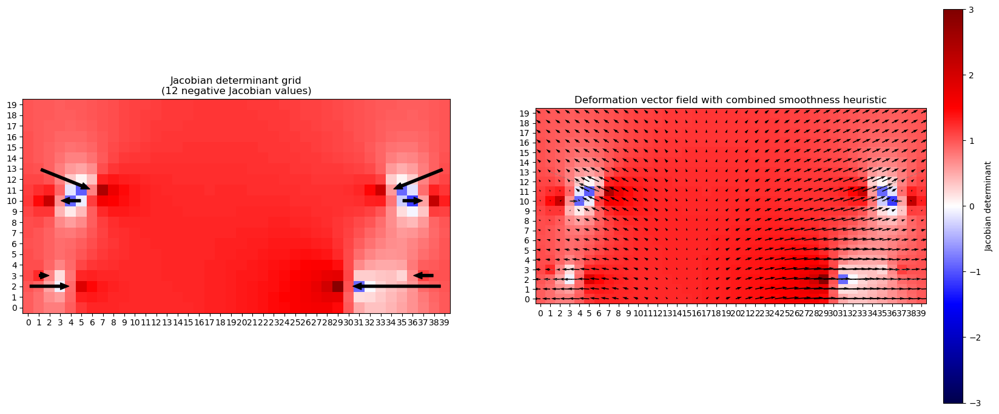

Iteration 148


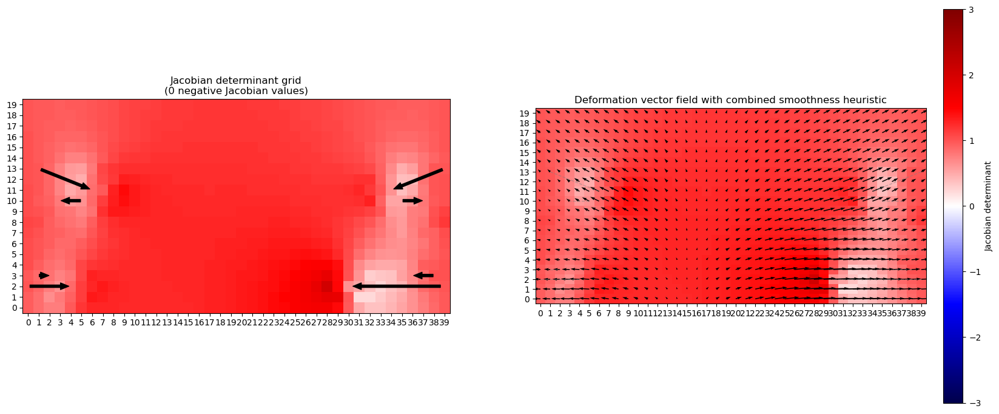

L1 error between original and modified deformation: 62.49144455719285
L2 error between original and modified deformation: 8.335237692799438


In [20]:
title = "combined smoothness"

smoothness = smoothness_heuristic(deformation)
min_smoothness_coords = min_coords(smoothness)

print("Smoothness:")
pprint(smoothness)
print(f"Minimum smoothness value at coordinates: {min_smoothness_coords}")
print(f"Average vector at these coordinates: {get_3x3_vector_patch(deformation, *min_smoothness_coords)[1]}")
plot_deformation(msample, fsample, deformation, title=title, show_values=show_values, show_points=show_points)

# Replace the vector at the minimum smoothness coordinates with the average vector
deformation_modified = deformation.copy()
i = 0
while np.sum(jacobian.sitk_jacobian_determinant(deformation_modified) <= 0) > 0:
    deformation_modified = replace_lowest_smoothness(deformation_modified, heuristic_func=smoothness_heuristic)
    
    # Print the iteration number and plot the deformation 
    # if it's the first iteration or if there are no negative Jacobian values
    if np.sum(jacobian.sitk_jacobian_determinant(deformation_modified) <= 0) == 0:
        print(f"Iteration {i+1}")
        plot_deformation(msample, fsample, deformation_modified, title=title, show_values=show_values, show_points=show_points)
    i += 1
    
# Compare error difference between original and modified deformation vector fields
# L1 error between original and modified deformation
print(f"L1 error between original and modified deformation: {l1_error(deformation, deformation_modified)}")

# L2 error between original and modified deformation
print(f"L2 error between original and modified deformation: {l2_error(deformation, deformation_modified)}")

## Run smoothness heuristic with correction 4

### Input parameters

In [21]:
# Create sample set of points
mpoints_path = "data/corrected_correspondences_count_touching/mpoints.npy"
fpoints_path = "data/corrected_correspondences_count_touching/fpoints.npy"

mpoints, fpoints = correspondences.downsample_points(mpoints_path, fpoints_path, debug=False)

# Create a Laplacian matrix from the downsampled correspondence points
curr_idx = 2
msample = mpoints[mpoints[:, 0] == curr_idx].copy()
fsample = fpoints[fpoints[:, 0] == curr_idx].copy()
msample[:, 0] = 0
fsample[:, 0] = 0
fixed_sample = np.zeros((1, 20, 40))

pprint("Moving sample points:")
pprint(msample)
pprint("Fixed sample points:")
pprint(fsample)

msample = np.array([
       #[ 0.,  1., 22.],
       #[ 0.,  3., 32.],
       [ 0.,  5., 14.],
       #[ 0.,  6., 33.],
       #[ 0.,  7., 33.],
       [ 0.,  8.,  6.],
       #[ 0.,  9., 39.],
       #[ 0., 10., 36.],
       [ 0., 12., 36.],
       [ 0., 14., 18.],
       [ 0., 15., 38.],
       #[ 0., 16.,  9.],
       [ 0., 17., 16.],
       #[ 0., 18., 34.],
       #[ 0., 19., 22.]
    ])

fsample = np.array([
       #[ 0.,  1., 22.],
       #[ 0.,  3., 32.],
       [ 0.,  5., 29.],
       #[ 0.,  6., 33.],
       #[ 0.,  7., 33.],
       [ 0.,  8., 20.],
       #[ 0.,  9., 39.],
       #[ 0., 10., 36.],
       [ 0., 12., 30.],
       [ 0., 14., 25.],
       [ 0., 15.,  7.],
       #[ 0., 16.,  9.],
       [ 0., 17., 22.],
       #[ 0., 18., 34.],
       #[ 0., 19., 22.]
    ])

deformation, A, Zd, Yd, Xd = laplacian.sliceToSlice3DLaplacian(fixed_sample, msample, fsample)

show_points = False
show_values = False

'Moving sample points:'
array([[ 0.,  1., 22.],
       [ 0.,  3., 32.],
       [ 0.,  5., 14.],
       [ 0.,  6., 33.],
       [ 0.,  7., 33.],
       [ 0.,  8.,  6.],
       [ 0.,  9., 39.],
       [ 0., 10., 36.],
       [ 0., 12., 36.],
       [ 0., 14., 18.],
       [ 0., 15., 38.],
       [ 0., 16.,  9.],
       [ 0., 17., 16.],
       [ 0., 18., 34.],
       [ 0., 19., 22.]])
'Fixed sample points:'
array([[ 0.,  1., 22.],
       [ 0.,  3., 32.],
       [ 0.,  5., 29.],
       [ 0.,  6., 33.],
       [ 0.,  7., 33.],
       [ 0.,  8., 20.],
       [ 0.,  9., 39.],
       [ 0., 10., 36.],
       [ 0., 12., 30.],
       [ 0., 14., 25.],
       [ 0., 15.,  7.],
       [ 0., 16.,  9.],
       [ 0., 17., 22.],
       [ 0., 18., 34.],
       [ 0., 19., 22.]])


### Orientation

Smoothness:
array([[0.99916684, 0.9875312 , 0.98731621, 0.98690458, 0.98630748, 0.98520779, 0.98407681, 0.98262223, 0.98125198, 0.97965243, 0.97713092, 0.97329247, 0.96628471, 0.94841681, 0.76110706, 0.96766712, 0.99649075, 0.99372283, 0.99019018, 0.98868424, 0.98835987, 0.98890359, 0.99060233, 0.99225392, 0.99282807, 0.99211822, 0.98945497, 0.98583648, 0.98246382, 0.98183656, 0.98449583, 0.99023703, 0.99612642, 0.99858298, 0.99467138, 0.99244846, 0.99141491, 0.99066446, 0.99014128, 0.99556378],
       [0.98876079, 0.9996875 , 0.9997813 , 0.99970806, 0.99962317, 0.99947165, 0.99932462, 0.99899317, 0.99871886, 0.99846944, 0.99789584, 0.99711185, 0.99610787, 0.99172201, 0.95419242, 0.98845544, 0.99492314, 0.99657345, 0.9972969 , 0.99790062, 0.99839841, 0.99901   , 0.99945355, 0.99967672, 0.99991118, 0.99933905, 0.99916751, 0.99916806, 0.99975074, 0.99931612, 0.99972001, 0.99952531, 0.99958542, 0.9997504 , 0.99973699, 0.99949781, 0.99926735, 0.99933763, 0.99891981, 0.99532002],
       [0.

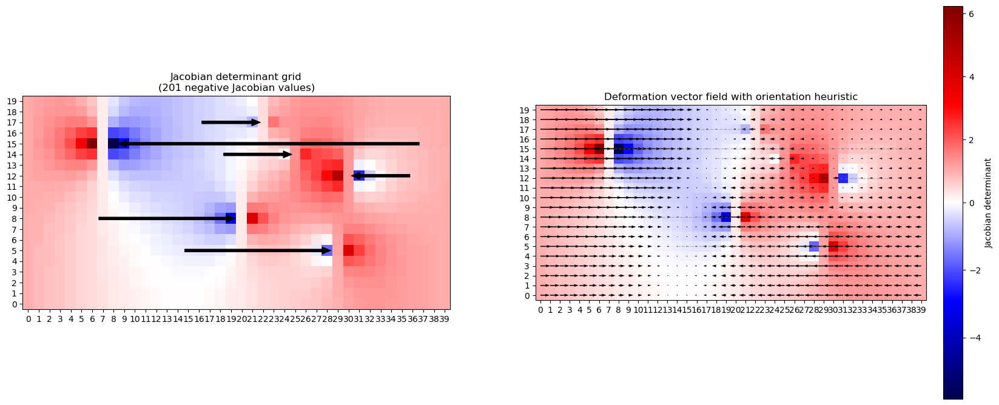

In [ ]:
title = "orientation"

smoothness = smoothness_heuristic(deformation)
min_smoothness_coords = min_coords(smoothness)

print("Smoothness:")
pprint(smoothness)
print(f"Minimum smoothness value at coordinates: {min_smoothness_coords}")
print(f"Average vector at these coordinates: {get_3x3_vector_patch(deformation, *min_smoothness_coords)[1]}")
plot_deformation(msample, fsample, deformation, title=title, show_values=show_values, show_points=show_points)

# Replace the vector at the minimum smoothness coordinates with the average vector
deformation_modified = deformation.copy()
i = 0
while np.sum(jacobian.sitk_jacobian_determinant(deformation_modified) <= 0) > 0:
    deformation_modified = replace_lowest_smoothness(deformation_modified, heuristic_func=orientation_heuristic)
    
    # Print the iteration number and plot the deformation 
    # if it's the first iteration or if there are no negative Jacobian values
    if np.sum(jacobian.sitk_jacobian_determinant(deformation_modified) <= 0) == 0:
        print(f"Iteration {i+1}")
        plot_deformation(msample, fsample, deformation_modified, title=title, show_values=show_values, show_points=show_points)
    i += 1
    
# Compare error difference between original and modified deformation vector fields
# L1 error between original and modified deformation
print(f"L1 error between original and modified deformation: {l1_error(deformation, deformation_modified)}")

# L2 error between original and modified deformation
print(f"L2 error between original and modified deformation: {l2_error(deformation, deformation_modified)}")

### Magnitude heuristic

Smoothness:
array([[0.99307365, 0.94215428, 0.97523353, 0.94216303, 0.94049555, 0.92122808, 0.98199638, 0.99793783, 0.99330493, 0.99457046, 0.99730753, 0.99873551, 0.99376431, 0.98891646, 0.98512761, 0.98850704, 0.99740551, 0.99573969, 0.99280495, 0.99128224, 0.9907311 , 0.99014521, 0.98893642, 0.98764654, 0.98672873, 0.98648792, 0.98768527, 0.99429496, 0.98538661, 0.93009466, 0.93955681, 0.92992751, 0.98642551, 0.98995106, 0.97689713, 0.96476666, 0.95923934, 0.95760643, 0.96593721, 0.99952039],
       [0.95187664, 0.99735329, 0.98556281, 0.97232736, 0.93941469, 0.97285648, 0.99565478, 0.99984952, 0.99950642, 0.99977567, 0.99971964, 0.99981404, 0.99956791, 0.99963362, 0.9991694 , 0.99839857, 0.99791415, 0.99774039, 0.99841552, 0.99873853, 0.99900913, 0.99890437, 0.99905439, 0.99941211, 0.99948978, 0.99955172, 0.99983098, 0.99930154, 0.99591644, 0.97695584, 0.95108398, 0.97685332, 0.99580736, 0.99947826, 0.99944916, 0.99914324, 0.99403609, 0.99926881, 0.99968632, 0.96955684],
       [0.

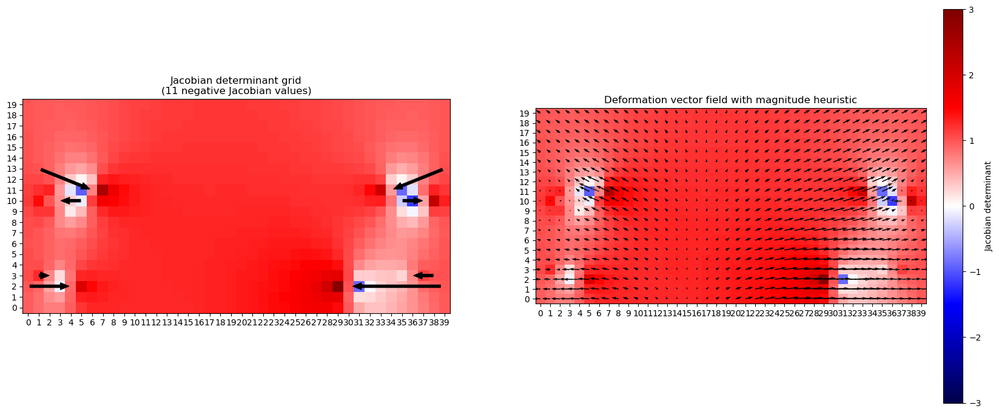

Iteration 112


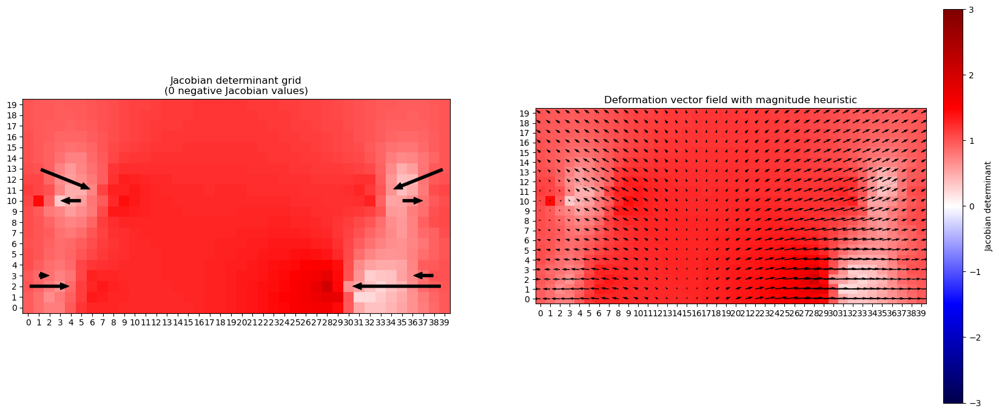

L1 error between original and modified deformation: 55.78009272931199
L2 error between original and modified deformation: 8.015189498284345


In [ ]:
title = "magnitude"

smoothness = smoothness_heuristic(deformation)
min_smoothness_coords = min_coords(smoothness)

print("Smoothness:")
pprint(smoothness)
print(f"Minimum smoothness value at coordinates: {min_smoothness_coords}")
print(f"Average vector at these coordinates: {get_3x3_vector_patch(deformation, *min_smoothness_coords)[1]}")
plot_deformation(msample, fsample, deformation, title=title, show_values=show_values, show_points=show_points)

# Replace the vector at the minimum smoothness coordinates with the average vector
deformation_modified = deformation.copy()
i = 0
while np.sum(jacobian.sitk_jacobian_determinant(deformation_modified) <= 0) > 0:
    deformation_modified = replace_lowest_smoothness(deformation_modified, heuristic_func=magnitude_heuristic)
    
    # Print the iteration number and plot the deformation 
    # if it's the first iteration or if there are no negative Jacobian values
    if np.sum(jacobian.sitk_jacobian_determinant(deformation_modified) <= 0) == 0:
        print(f"Iteration {i+1}")
        plot_deformation(msample, fsample, deformation_modified, title=title, show_values=show_values, show_points=show_points)
    i += 1
    
# Compare error difference between original and modified deformation vector fields
# L1 error between original and modified deformation
print(f"L1 error between original and modified deformation: {l1_error(deformation, deformation_modified)}")

# L2 error between original and modified deformation
print(f"L2 error between original and modified deformation: {l2_error(deformation, deformation_modified)}")

### Combined

Smoothness:
array([[0.99538969, 0.98158395, 0.98168566, 0.9810852 , 0.98023357, 0.97905304, 0.97795557, 0.976294  , 0.97539037, 0.97453712, 0.97238189, 0.96941629, 0.96327506, 0.9345691 , 0.98675999, 0.96187374, 0.94788992, 0.93500816, 0.91924008, 0.90086311, 0.87757127, 0.87399492, 0.64391325, 0.89984152, 0.91192612, 0.92924478, 0.93468624, 0.93233605, 0.92798995, 0.93165257, 0.95117966, 0.99644738, 0.9482841 , 0.90566832, 0.92472349, 0.94471647, 0.95545981, 0.96179171, 0.9655759 , 0.99995323],
       [0.98721182, 0.99892675, 0.99906106, 0.99882832, 0.99866108, 0.99853911, 0.99826894, 0.99788351, 0.99754253, 0.99710522, 0.99611514, 0.99307582, 0.9871872 , 0.95508216, 0.96262307, 0.99059932, 0.99411802, 0.99586601, 0.99827399, 0.99694348, 0.97760969, 0.86563412, 0.        , 0.89288353, 0.97999103, 0.99323119, 0.99607645, 0.99738999, 0.99954126, 0.99666296, 0.99821431, 0.99768419, 0.96823209, 0.99514354, 0.99620018, 0.99780092, 0.99760957, 0.99920402, 0.99962911, 0.96702301],
       [0.

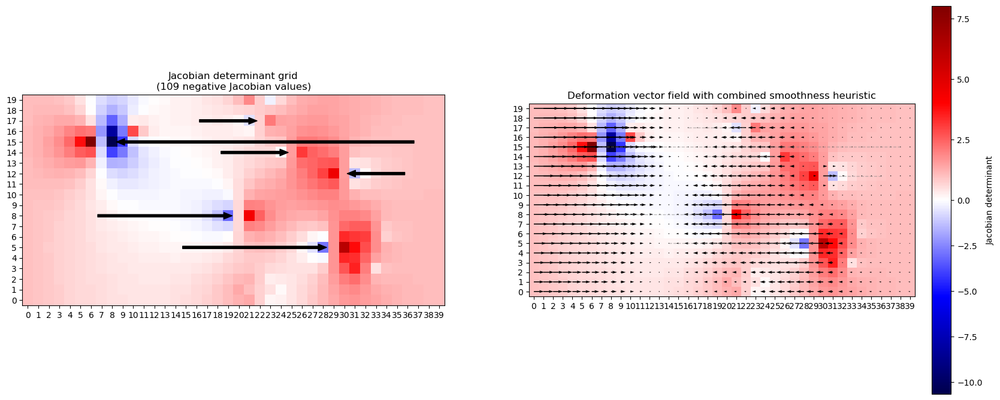

In [ ]:
title = "combined smoothness"

smoothness = smoothness_heuristic(deformation)
min_smoothness_coords = min_coords(smoothness)

print("Smoothness:")
pprint(smoothness)
print(f"Minimum smoothness value at coordinates: {min_smoothness_coords}")
print(f"Average vector at these coordinates: {get_3x3_vector_patch(deformation, *min_smoothness_coords)[1]}")
plot_deformation(msample, fsample, deformation, title=title, show_values=show_values, show_points=show_points)

# Replace the vector at the minimum smoothness coordinates with the average vector
deformation_modified = deformation.copy()
i = 0
while np.sum(jacobian.sitk_jacobian_determinant(deformation_modified) <= 0) > 0:
    deformation_modified = replace_lowest_smoothness(deformation_modified, heuristic_func=smoothness_heuristic)
    
    # Print the iteration number and plot the deformation 
    # if it's the first iteration or if there are no negative Jacobian values
    if np.sum(jacobian.sitk_jacobian_determinant(deformation_modified) <= 0) == 0:
        print(f"Iteration {i+1}")
        plot_deformation(msample, fsample, deformation_modified, title=title, show_values=show_values, show_points=show_points)
    i += 1
    
# Compare error difference between original and modified deformation vector fields
# L1 error between original and modified deformation
print(f"L1 error between original and modified deformation: {l1_error(deformation, deformation_modified)}")

# L2 error between original and modified deformation
print(f"L2 error between original and modified deformation: {l2_error(deformation, deformation_modified)}")

## Run smoothness heuristic with correction 4

### Input parameters

In [ ]:
msample = np.array([
    [0, 2, 0],
    [0, 3, 1],
    [0, 10, 7],
    [0, 13, 1],
    [0, 2, 39],
    [0, 3, 38],
    [0, 10, 32],
    [0, 13, 39],
])
fsample = np.array([
    [0, 2, 4],
    [0, 3, 2],
    [0, 10, 3],
    [0, 11, 6],
    [0, 2, 30],
    [0, 3, 36],
    [0, 10, 37],
    [0, 11, 34]
])
    
fixed_sample = np.zeros((1, 20, 40))

deformation, A, Zd, Yd, Xd = laplacian.sliceToSlice3DLaplacian(fixed_sample, msample, fsample)

show_points = False
show_values = False

### Orientation

Smoothness:
array([[0.99656259, 0.93695614, 0.97513488, 0.93520376, 0.93583878, 0.9159548 , 0.98354164, 0.99302702, 0.98769298, 0.98898134, 0.99276151, 0.99788207, 0.99725232, 0.9912402 , 0.98585588, 0.98923269, 0.99822122, 0.99547058, 0.99315276, 0.9917766 , 0.99043191, 0.98890956, 0.98787337, 0.98675107, 0.98531407, 0.98498456, 0.98676583, 0.99401336, 0.98403896, 0.9256594 , 0.93593997, 0.92584231, 0.98638735, 0.98819481, 0.97519164, 0.96415525, 0.95716046, 0.95257618, 0.9539294 , 0.99849669],
       [0.93836909, 0.99793662, 0.9870162 , 0.96988212, 0.93464891, 0.96986065, 0.99483711, 0.99993304, 0.99902582, 0.99881842, 0.9988319 , 0.99919276, 0.99898876, 0.99990217, 0.99879886, 0.99839587, 0.99871847, 0.99866329, 0.99850696, 0.99806116, 0.9981034 , 0.9986809 , 0.99877018, 0.99911328, 0.99957974, 0.99976439, 0.99964026, 0.99909049, 0.99533337, 0.97530901, 0.94840213, 0.9750246 , 0.99531066, 0.99932354, 0.99986938, 0.99954329, 0.99687044, 0.99997381, 0.99908548, 0.95235328],
       [0.

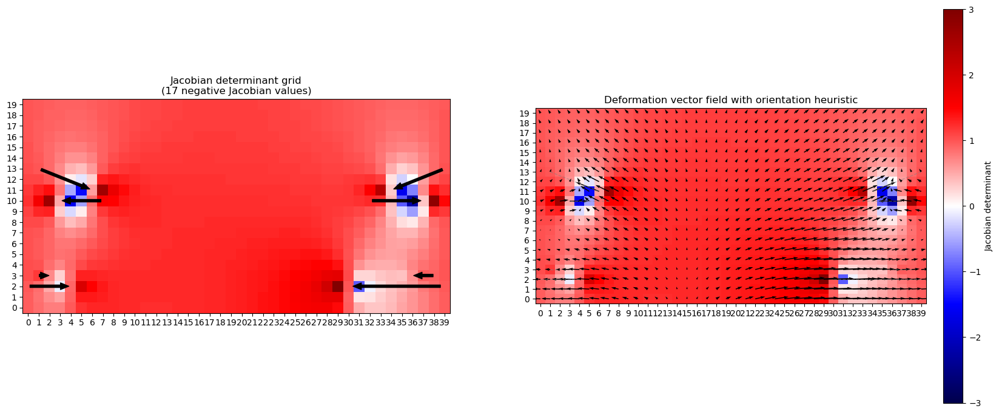

Iteration 1847


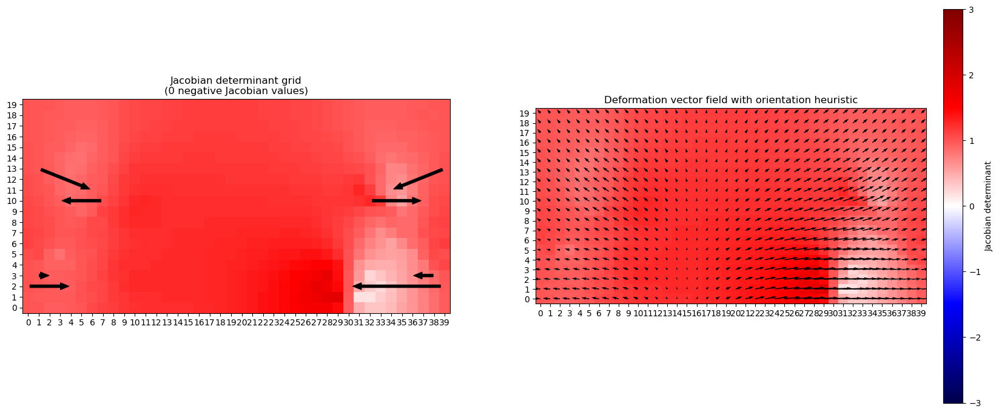

L1 error between original and modified deformation: 226.22742688568667
L2 error between original and modified deformation: 19.097338953795077


In [ ]:
title = "orientation"

smoothness = smoothness_heuristic(deformation)
min_smoothness_coords = min_coords(smoothness)

print("Smoothness:")
pprint(smoothness)
print(f"Minimum smoothness value at coordinates: {min_smoothness_coords}")
print(f"Average vector at these coordinates: {get_3x3_vector_patch(deformation, *min_smoothness_coords)[1]}")
plot_deformation(msample, fsample, deformation, title=title, show_values=show_values, show_points=show_points)

# Replace the vector at the minimum smoothness coordinates with the average vector
deformation_modified = deformation.copy()
i = 0
while np.sum(jacobian.sitk_jacobian_determinant(deformation_modified) <= 0) > 0:
    deformation_modified = replace_lowest_smoothness(deformation_modified, heuristic_func=orientation_heuristic)
    
    # Print the iteration number and plot the deformation 
    # if it's the first iteration or if there are no negative Jacobian values
    if np.sum(jacobian.sitk_jacobian_determinant(deformation_modified) <= 0) == 0:
        print(f"Iteration {i+1}")
        plot_deformation(msample, fsample, deformation_modified, title=title, show_values=show_values, show_points=show_points)
    i += 1
    
# Compare error difference between original and modified deformation vector fields
# L1 error between original and modified deformation
print(f"L1 error between original and modified deformation: {l1_error(deformation, deformation_modified)}")

# L2 error between original and modified deformation
print(f"L2 error between original and modified deformation: {l2_error(deformation, deformation_modified)}")

### Magnitude heuristic

Smoothness:
array([[0.99656259, 0.93695614, 0.97513488, 0.93520376, 0.93583878, 0.9159548 , 0.98354164, 0.99302702, 0.98769298, 0.98898134, 0.99276151, 0.99788207, 0.99725232, 0.9912402 , 0.98585588, 0.98923269, 0.99822122, 0.99547058, 0.99315276, 0.9917766 , 0.99043191, 0.98890956, 0.98787337, 0.98675107, 0.98531407, 0.98498456, 0.98676583, 0.99401336, 0.98403896, 0.9256594 , 0.93593997, 0.92584231, 0.98638735, 0.98819481, 0.97519164, 0.96415525, 0.95716046, 0.95257618, 0.9539294 , 0.99849669],
       [0.93836909, 0.99793662, 0.9870162 , 0.96988212, 0.93464891, 0.96986065, 0.99483711, 0.99993304, 0.99902582, 0.99881842, 0.9988319 , 0.99919276, 0.99898876, 0.99990217, 0.99879886, 0.99839587, 0.99871847, 0.99866329, 0.99850696, 0.99806116, 0.9981034 , 0.9986809 , 0.99877018, 0.99911328, 0.99957974, 0.99976439, 0.99964026, 0.99909049, 0.99533337, 0.97530901, 0.94840213, 0.9750246 , 0.99531066, 0.99932354, 0.99986938, 0.99954329, 0.99687044, 0.99997381, 0.99908548, 0.95235328],
       [0.

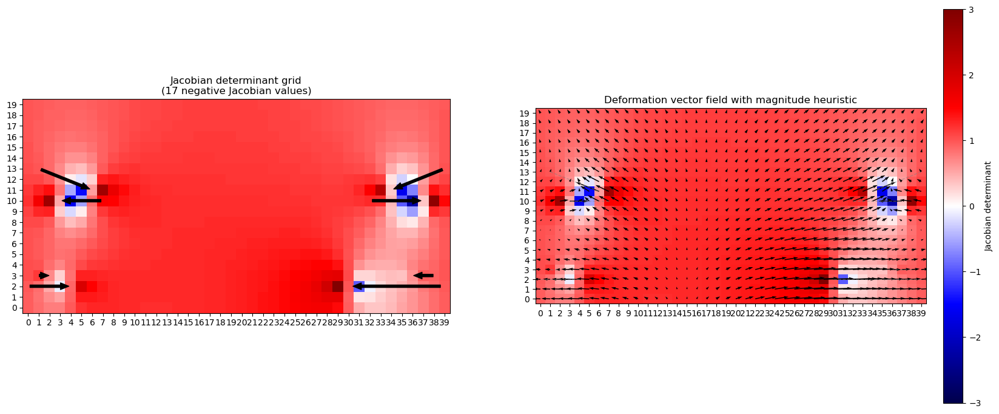

Iteration 140


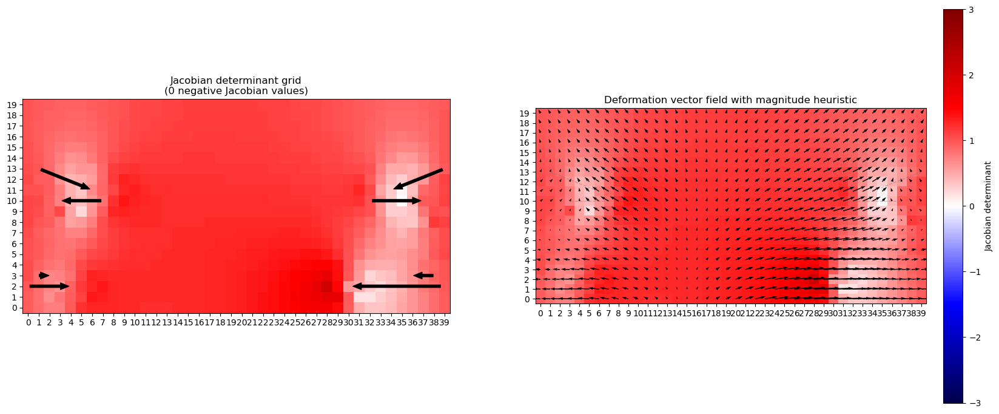

L1 error between original and modified deformation: 75.53904026577376
L2 error between original and modified deformation: 10.632115984712854


In [ ]:
title = "magnitude"

smoothness = smoothness_heuristic(deformation)
min_smoothness_coords = min_coords(smoothness)

print("Smoothness:")
pprint(smoothness)
print(f"Minimum smoothness value at coordinates: {min_smoothness_coords}")
print(f"Average vector at these coordinates: {get_3x3_vector_patch(deformation, *min_smoothness_coords)[1]}")
plot_deformation(msample, fsample, deformation, title=title, show_values=show_values, show_points=show_points)

# Replace the vector at the minimum smoothness coordinates with the average vector
deformation_modified = deformation.copy()
i = 0
while np.sum(jacobian.sitk_jacobian_determinant(deformation_modified) <= 0) > 0:
    deformation_modified = replace_lowest_smoothness(deformation_modified, heuristic_func=magnitude_heuristic)
    
    # Print the iteration number and plot the deformation 
    # if it's the first iteration or if there are no negative Jacobian values
    if np.sum(jacobian.sitk_jacobian_determinant(deformation_modified) <= 0) == 0:
        print(f"Iteration {i+1}")
        plot_deformation(msample, fsample, deformation_modified, title=title, show_values=show_values, show_points=show_points)
    i += 1
    
# Compare error difference between original and modified deformation vector fields
# L1 error between original and modified deformation
print(f"L1 error between original and modified deformation: {l1_error(deformation, deformation_modified)}")

# L2 error between original and modified deformation
print(f"L2 error between original and modified deformation: {l2_error(deformation, deformation_modified)}")

### Combined

Smoothness:
array([[0.99656259, 0.93695614, 0.97513488, 0.93520376, 0.93583878, 0.9159548 , 0.98354164, 0.99302702, 0.98769298, 0.98898134, 0.99276151, 0.99788207, 0.99725232, 0.9912402 , 0.98585588, 0.98923269, 0.99822122, 0.99547058, 0.99315276, 0.9917766 , 0.99043191, 0.98890956, 0.98787337, 0.98675107, 0.98531407, 0.98498456, 0.98676583, 0.99401336, 0.98403896, 0.9256594 , 0.93593997, 0.92584231, 0.98638735, 0.98819481, 0.97519164, 0.96415525, 0.95716046, 0.95257618, 0.9539294 , 0.99849669],
       [0.93836909, 0.99793662, 0.9870162 , 0.96988212, 0.93464891, 0.96986065, 0.99483711, 0.99993304, 0.99902582, 0.99881842, 0.9988319 , 0.99919276, 0.99898876, 0.99990217, 0.99879886, 0.99839587, 0.99871847, 0.99866329, 0.99850696, 0.99806116, 0.9981034 , 0.9986809 , 0.99877018, 0.99911328, 0.99957974, 0.99976439, 0.99964026, 0.99909049, 0.99533337, 0.97530901, 0.94840213, 0.9750246 , 0.99531066, 0.99932354, 0.99986938, 0.99954329, 0.99687044, 0.99997381, 0.99908548, 0.95235328],
       [0.

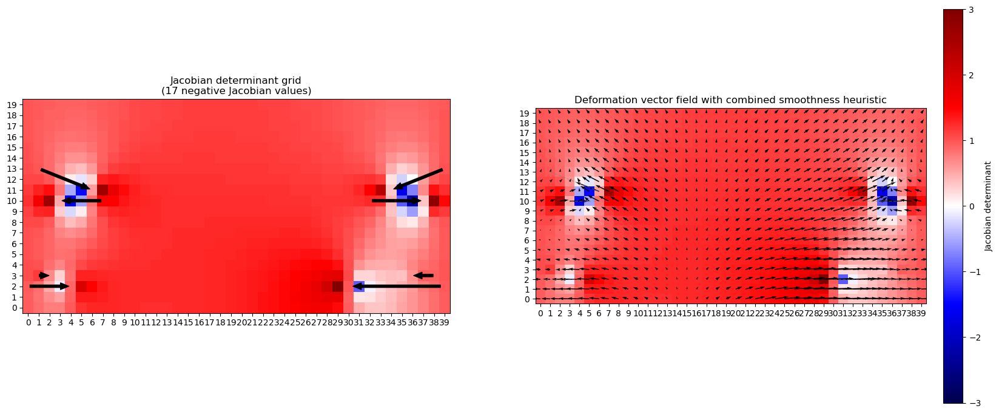

Iteration 173


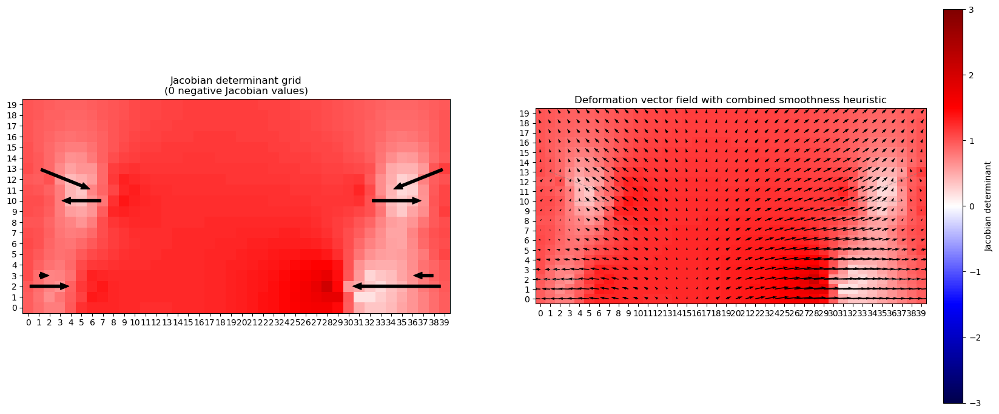

L1 error between original and modified deformation: 84.65625599453723
L2 error between original and modified deformation: 11.147540989442902


In [ ]:
title = "combined smoothness"

smoothness = smoothness_heuristic(deformation)
min_smoothness_coords = min_coords(smoothness)

print("Smoothness:")
pprint(smoothness)
print(f"Minimum smoothness value at coordinates: {min_smoothness_coords}")
print(f"Average vector at these coordinates: {get_3x3_vector_patch(deformation, *min_smoothness_coords)[1]}")
plot_deformation(msample, fsample, deformation, title=title, show_values=show_values, show_points=show_points)

# Replace the vector at the minimum smoothness coordinates with the average vector
deformation_modified = deformation.copy()
i = 0
while np.sum(jacobian.sitk_jacobian_determinant(deformation_modified) <= 0) > 0:
    deformation_modified = replace_lowest_smoothness(deformation_modified, heuristic_func=smoothness_heuristic)
    
    # Print the iteration number and plot the deformation 
    # if it's the first iteration or if there are no negative Jacobian values
    if np.sum(jacobian.sitk_jacobian_determinant(deformation_modified) <= 0) == 0:
        print(f"Iteration {i+1}")
        plot_deformation(msample, fsample, deformation_modified, title=title, show_values=show_values, show_points=show_points)
    i += 1
    
# Compare error difference between original and modified deformation vector fields
# L1 error between original and modified deformation
print(f"L1 error between original and modified deformation: {l1_error(deformation, deformation_modified)}")

# L2 error between original and modified deformation
print(f"L2 error between original and modified deformation: {l2_error(deformation, deformation_modified)}")

## Run smoothness heuristic with correction 3b

### Input parameters

In [ ]:
msample = np.array([
    [0, 2, 0],
    [0, 3, 1],
    [0, 10, 5],
    [0, 13, 1],
    [0, 2, 39],
    [0, 3, 38],
    [0, 10, 35],
    [0, 13, 39],
])
fsample = np.array([
    [0, 2, 4],
    [0, 3, 2],
    [0, 10, 3],
    [0, 11, 6],
    [0, 2, 30],
    [0, 3, 36],
    [0, 10, 37],
    [0, 11, 34]
])
    
fixed_sample = np.zeros((1, 20, 40))

deformation, A, Zd, Yd, Xd = laplacian.sliceToSlice3DLaplacian(fixed_sample, msample, fsample)

show_points = False
show_values = False

### Orientation

Smoothness:
array([[0.99307365, 0.94215428, 0.97523353, 0.94216303, 0.94049555, 0.92122808, 0.98199638, 0.99793783, 0.99330493, 0.99457046, 0.99730753, 0.99873551, 0.99376431, 0.98891646, 0.98512761, 0.98850704, 0.99740551, 0.99573969, 0.99280495, 0.99128224, 0.9907311 , 0.99014521, 0.98893642, 0.98764654, 0.98672873, 0.98648792, 0.98768527, 0.99429496, 0.98538661, 0.93009466, 0.93955681, 0.92992751, 0.98642551, 0.98995106, 0.97689713, 0.96476666, 0.95923934, 0.95760643, 0.96593721, 0.99952039],
       [0.95187664, 0.99735329, 0.98556281, 0.97232736, 0.93941469, 0.97285648, 0.99565478, 0.99984952, 0.99950642, 0.99977567, 0.99971964, 0.99981404, 0.99956791, 0.99963362, 0.9991694 , 0.99839857, 0.99791415, 0.99774039, 0.99841552, 0.99873853, 0.99900913, 0.99890437, 0.99905439, 0.99941211, 0.99948978, 0.99955172, 0.99983098, 0.99930154, 0.99591644, 0.97695584, 0.95108398, 0.97685332, 0.99580736, 0.99947826, 0.99944916, 0.99914324, 0.99403609, 0.99926881, 0.99968632, 0.96955684],
       [0.

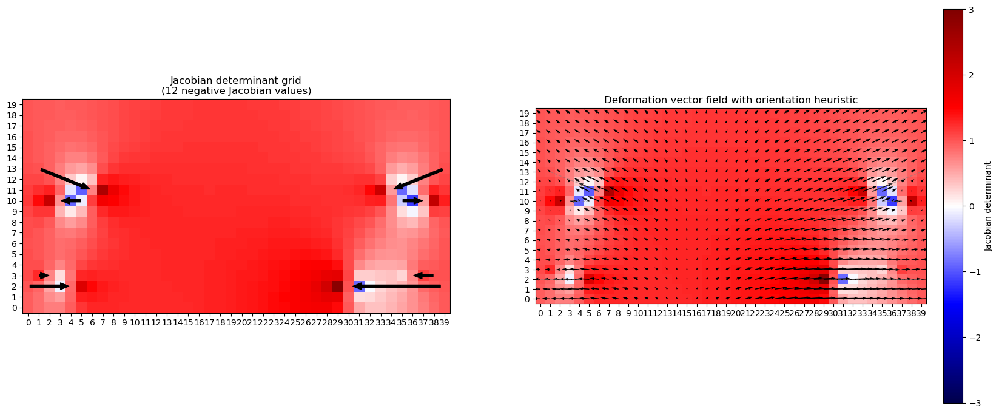

Iteration 1231


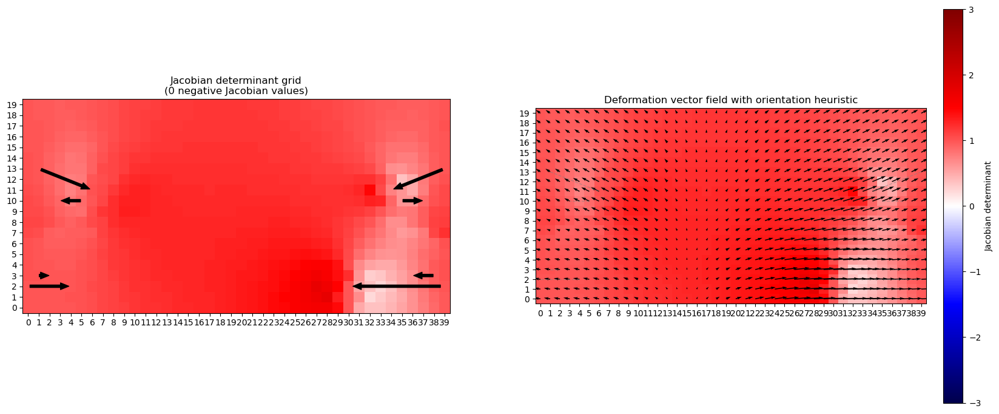

L1 error between original and modified deformation: 138.6205140258675
L2 error between original and modified deformation: 11.786561199491663


In [ ]:
title = "orientation"

smoothness = smoothness_heuristic(deformation)
min_smoothness_coords = min_coords(smoothness)

print("Smoothness:")
pprint(smoothness)
print(f"Minimum smoothness value at coordinates: {min_smoothness_coords}")
print(f"Average vector at these coordinates: {get_3x3_vector_patch(deformation, *min_smoothness_coords)[1]}")
plot_deformation(msample, fsample, deformation, title=title, show_values=show_values, show_points=show_points)

# Replace the vector at the minimum smoothness coordinates with the average vector
deformation_modified = deformation.copy()
i = 0
while np.sum(jacobian.sitk_jacobian_determinant(deformation_modified) <= 0) > 0:
    deformation_modified = replace_lowest_smoothness(deformation_modified, heuristic_func=orientation_heuristic)
    
    # Print the iteration number and plot the deformation 
    # if it's the first iteration or if there are no negative Jacobian values
    if np.sum(jacobian.sitk_jacobian_determinant(deformation_modified) <= 0) == 0:
        print(f"Iteration {i+1}")
        plot_deformation(msample, fsample, deformation_modified, title=title, show_values=show_values, show_points=show_points)
    i += 1
    
# Compare error difference between original and modified deformation vector fields
# L1 error between original and modified deformation
print(f"L1 error between original and modified deformation: {l1_error(deformation, deformation_modified)}")

# L2 error between original and modified deformation
print(f"L2 error between original and modified deformation: {l2_error(deformation, deformation_modified)}")

### Magnitude heuristic

Smoothness:
array([[0.99307365, 0.94215428, 0.97523353, 0.94216303, 0.94049555, 0.92122808, 0.98199638, 0.99793783, 0.99330493, 0.99457046, 0.99730753, 0.99873551, 0.99376431, 0.98891646, 0.98512761, 0.98850704, 0.99740551, 0.99573969, 0.99280495, 0.99128224, 0.9907311 , 0.99014521, 0.98893642, 0.98764654, 0.98672873, 0.98648792, 0.98768527, 0.99429496, 0.98538661, 0.93009466, 0.93955681, 0.92992751, 0.98642551, 0.98995106, 0.97689713, 0.96476666, 0.95923934, 0.95760643, 0.96593721, 0.99952039],
       [0.95187664, 0.99735329, 0.98556281, 0.97232736, 0.93941469, 0.97285648, 0.99565478, 0.99984952, 0.99950642, 0.99977567, 0.99971964, 0.99981404, 0.99956791, 0.99963362, 0.9991694 , 0.99839857, 0.99791415, 0.99774039, 0.99841552, 0.99873853, 0.99900913, 0.99890437, 0.99905439, 0.99941211, 0.99948978, 0.99955172, 0.99983098, 0.99930154, 0.99591644, 0.97695584, 0.95108398, 0.97685332, 0.99580736, 0.99947826, 0.99944916, 0.99914324, 0.99403609, 0.99926881, 0.99968632, 0.96955684],
       [0.

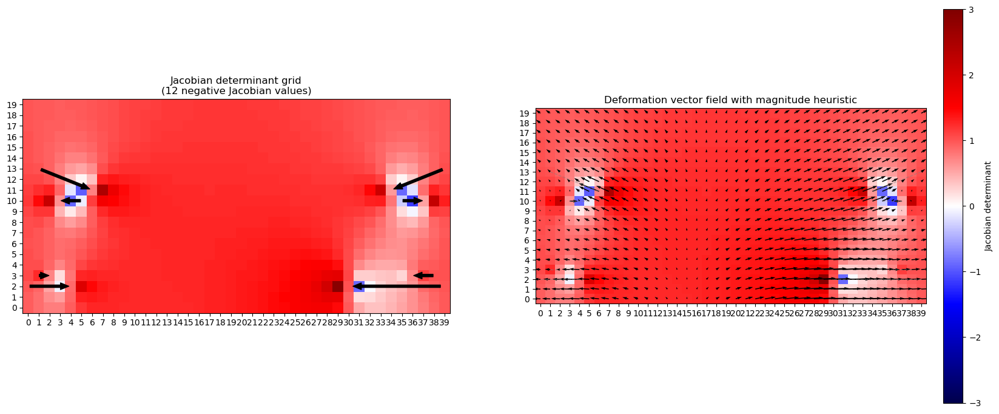

Iteration 112


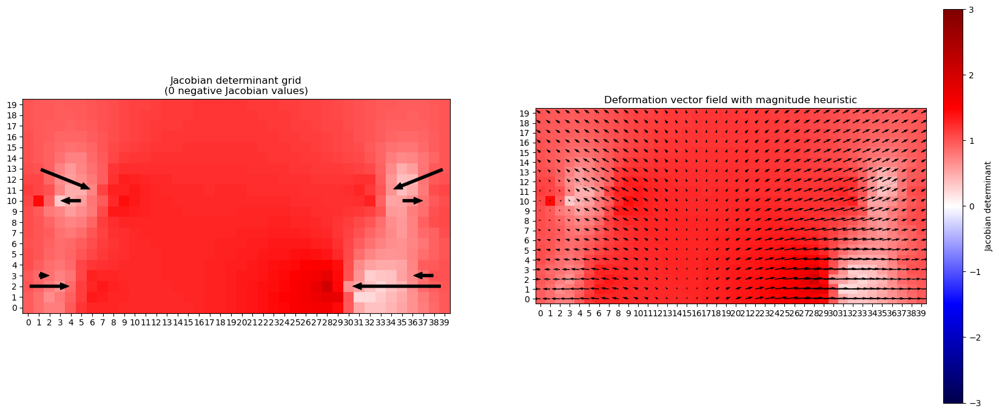

L1 error between original and modified deformation: 55.78009272931199
L2 error between original and modified deformation: 8.015189498284345


In [ ]:
title = "magnitude"

smoothness = smoothness_heuristic(deformation)
min_smoothness_coords = min_coords(smoothness)

print("Smoothness:")
pprint(smoothness)
print(f"Minimum smoothness value at coordinates: {min_smoothness_coords}")
print(f"Average vector at these coordinates: {get_3x3_vector_patch(deformation, *min_smoothness_coords)[1]}")
plot_deformation(msample, fsample, deformation, title=title, show_values=show_values, show_points=show_points)

# Replace the vector at the minimum smoothness coordinates with the average vector
deformation_modified = deformation.copy()
i = 0
while np.sum(jacobian.sitk_jacobian_determinant(deformation_modified) <= 0) > 0:
    deformation_modified = replace_lowest_smoothness(deformation_modified, heuristic_func=magnitude_heuristic)
    
    # Print the iteration number and plot the deformation 
    # if it's the first iteration or if there are no negative Jacobian values
    if np.sum(jacobian.sitk_jacobian_determinant(deformation_modified) <= 0) == 0:
        print(f"Iteration {i+1}")
        plot_deformation(msample, fsample, deformation_modified, title=title, show_values=show_values, show_points=show_points)
    i += 1
    
# Compare error difference between original and modified deformation vector fields
# L1 error between original and modified deformation
print(f"L1 error between original and modified deformation: {l1_error(deformation, deformation_modified)}")

# L2 error between original and modified deformation
print(f"L2 error between original and modified deformation: {l2_error(deformation, deformation_modified)}")

### Combined

Smoothness:
array([[0.99307365, 0.94215428, 0.97523353, 0.94216303, 0.94049555, 0.92122808, 0.98199638, 0.99793783, 0.99330493, 0.99457046, 0.99730753, 0.99873551, 0.99376431, 0.98891646, 0.98512761, 0.98850704, 0.99740551, 0.99573969, 0.99280495, 0.99128224, 0.9907311 , 0.99014521, 0.98893642, 0.98764654, 0.98672873, 0.98648792, 0.98768527, 0.99429496, 0.98538661, 0.93009466, 0.93955681, 0.92992751, 0.98642551, 0.98995106, 0.97689713, 0.96476666, 0.95923934, 0.95760643, 0.96593721, 0.99952039],
       [0.95187664, 0.99735329, 0.98556281, 0.97232736, 0.93941469, 0.97285648, 0.99565478, 0.99984952, 0.99950642, 0.99977567, 0.99971964, 0.99981404, 0.99956791, 0.99963362, 0.9991694 , 0.99839857, 0.99791415, 0.99774039, 0.99841552, 0.99873853, 0.99900913, 0.99890437, 0.99905439, 0.99941211, 0.99948978, 0.99955172, 0.99983098, 0.99930154, 0.99591644, 0.97695584, 0.95108398, 0.97685332, 0.99580736, 0.99947826, 0.99944916, 0.99914324, 0.99403609, 0.99926881, 0.99968632, 0.96955684],
       [0.

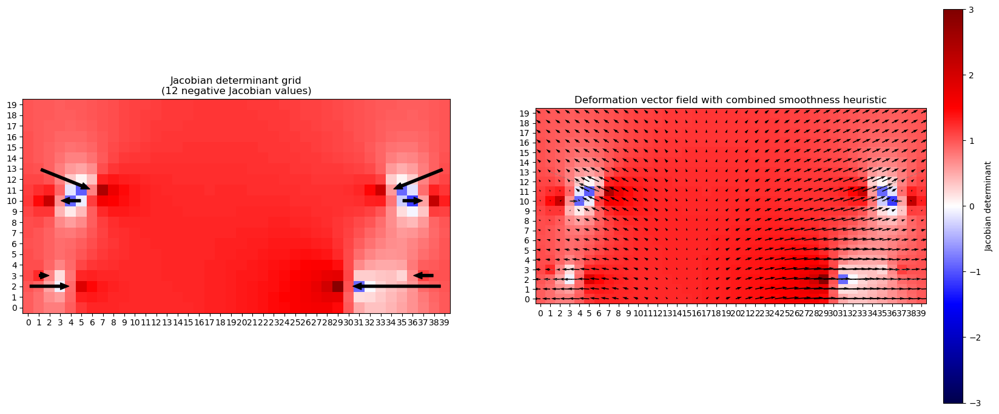

Iteration 148


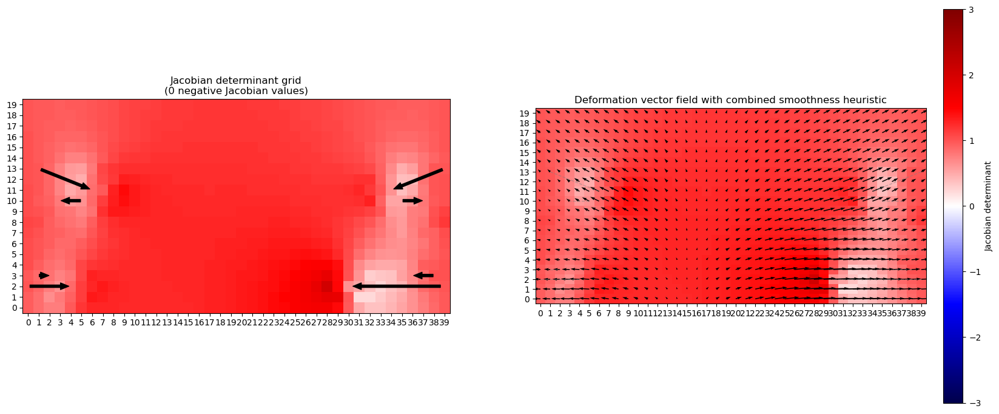

L1 error between original and modified deformation: 62.49144455719285
L2 error between original and modified deformation: 8.335237692799438


In [ ]:
title = "combined smoothness"

smoothness = smoothness_heuristic(deformation)
min_smoothness_coords = min_coords(smoothness)

print("Smoothness:")
pprint(smoothness)
print(f"Minimum smoothness value at coordinates: {min_smoothness_coords}")
print(f"Average vector at these coordinates: {get_3x3_vector_patch(deformation, *min_smoothness_coords)[1]}")
plot_deformation(msample, fsample, deformation, title=title, show_values=show_values, show_points=show_points)

# Replace the vector at the minimum smoothness coordinates with the average vector
deformation_modified = deformation.copy()
i = 0
while np.sum(jacobian.sitk_jacobian_determinant(deformation_modified) <= 0) > 0:
    deformation_modified = replace_lowest_smoothness(deformation_modified, heuristic_func=smoothness_heuristic)
    
    # Print the iteration number and plot the deformation 
    # if it's the first iteration or if there are no negative Jacobian values
    if np.sum(jacobian.sitk_jacobian_determinant(deformation_modified) <= 0) == 0:
        print(f"Iteration {i+1}")
        plot_deformation(msample, fsample, deformation_modified, title=title, show_values=show_values, show_points=show_points)
    i += 1
    
# Compare error difference between original and modified deformation vector fields
# L1 error between original and modified deformation
print(f"L1 error between original and modified deformation: {l1_error(deformation, deformation_modified)}")

# L2 error between original and modified deformation
print(f"L2 error between original and modified deformation: {l2_error(deformation, deformation_modified)}")

## Run smoothness heuristic with correction 4

### Input parameters

In [ ]:
# Create sample set of points
mpoints_path = "data/corrected_correspondences_count_touching/mpoints.npy"
fpoints_path = "data/corrected_correspondences_count_touching/fpoints.npy"

mpoints, fpoints = correspondences.downsample_points(mpoints_path, fpoints_path, debug=False)

# Create a Laplacian matrix from the downsampled correspondence points
curr_idx = 2
msample = mpoints[mpoints[:, 0] == curr_idx].copy()
fsample = fpoints[fpoints[:, 0] == curr_idx].copy()
msample[:, 0] = 0
fsample[:, 0] = 0
fixed_sample = np.zeros((1, 20, 40))

pprint("Moving sample points:")
pprint(msample)
pprint("Fixed sample points:")
pprint(fsample)

msample = np.array([
       #[ 0.,  1., 22.],
       #[ 0.,  3., 32.],
       [ 0.,  5., 14.],
       #[ 0.,  6., 33.],
       #[ 0.,  7., 33.],
       [ 0.,  8.,  6.],
       #[ 0.,  9., 39.],
       #[ 0., 10., 36.],
       [ 0., 12., 36.],
       [ 0., 14., 18.],
       [ 0., 15., 38.],
       #[ 0., 16.,  9.],
       [ 0., 17., 16.],
       #[ 0., 18., 34.],
       #[ 0., 19., 22.]
    ])

fsample = np.array([
       #[ 0.,  1., 22.],
       #[ 0.,  3., 32.],
       [ 0.,  5., 29.],
       #[ 0.,  6., 33.],
       #[ 0.,  7., 33.],
       [ 0.,  8., 20.],
       #[ 0.,  9., 39.],
       #[ 0., 10., 36.],
       [ 0., 12., 30.],
       [ 0., 14., 25.],
       [ 0., 15.,  7.],
       #[ 0., 16.,  9.],
       [ 0., 17., 22.],
       #[ 0., 18., 34.],
       #[ 0., 19., 22.]
    ])

deformation, A, Zd, Yd, Xd = laplacian.sliceToSlice3DLaplacian(fixed_sample, msample, fsample)

show_points = False
show_values = False

'Moving sample points:'
array([[ 0.,  1., 22.],
       [ 0.,  3., 32.],
       [ 0.,  5., 14.],
       [ 0.,  6., 33.],
       [ 0.,  7., 33.],
       [ 0.,  8.,  6.],
       [ 0.,  9., 39.],
       [ 0., 10., 36.],
       [ 0., 12., 36.],
       [ 0., 14., 18.],
       [ 0., 15., 38.],
       [ 0., 16.,  9.],
       [ 0., 17., 16.],
       [ 0., 18., 34.],
       [ 0., 19., 22.]])
'Fixed sample points:'
array([[ 0.,  1., 22.],
       [ 0.,  3., 32.],
       [ 0.,  5., 29.],
       [ 0.,  6., 33.],
       [ 0.,  7., 33.],
       [ 0.,  8., 20.],
       [ 0.,  9., 39.],
       [ 0., 10., 36.],
       [ 0., 12., 30.],
       [ 0., 14., 25.],
       [ 0., 15.,  7.],
       [ 0., 16.,  9.],
       [ 0., 17., 22.],
       [ 0., 18., 34.],
       [ 0., 19., 22.]])


### Orientation

Smoothness:
array([[0.99916684, 0.9875312 , 0.98731621, 0.98690458, 0.98630748, 0.98520779, 0.98407681, 0.98262223, 0.98125198, 0.97965243, 0.97713092, 0.97329247, 0.96628471, 0.94841681, 0.76110706, 0.96766712, 0.99649075, 0.99372283, 0.99019018, 0.98868424, 0.98835987, 0.98890359, 0.99060233, 0.99225392, 0.99282807, 0.99211822, 0.98945497, 0.98583648, 0.98246382, 0.98183656, 0.98449583, 0.99023703, 0.99612642, 0.99858298, 0.99467138, 0.99244846, 0.99141491, 0.99066446, 0.99014128, 0.99556378],
       [0.98876079, 0.9996875 , 0.9997813 , 0.99970806, 0.99962317, 0.99947165, 0.99932462, 0.99899317, 0.99871886, 0.99846944, 0.99789584, 0.99711185, 0.99610787, 0.99172201, 0.95419242, 0.98845544, 0.99492314, 0.99657345, 0.9972969 , 0.99790062, 0.99839841, 0.99901   , 0.99945355, 0.99967672, 0.99991118, 0.99933905, 0.99916751, 0.99916806, 0.99975074, 0.99931612, 0.99972001, 0.99952531, 0.99958542, 0.9997504 , 0.99973699, 0.99949781, 0.99926735, 0.99933763, 0.99891981, 0.99532002],
       [0.

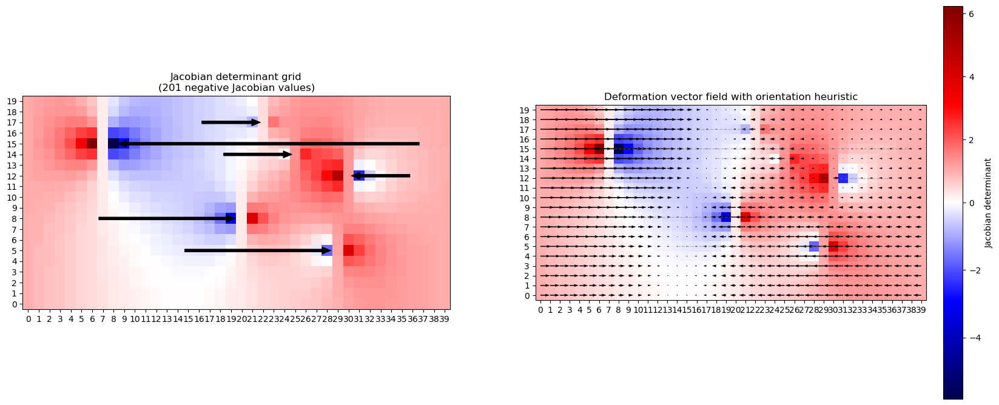

In [ ]:
title = "orientation"

smoothness = smoothness_heuristic(deformation)
min_smoothness_coords = min_coords(smoothness)

print("Smoothness:")
pprint(smoothness)
print(f"Minimum smoothness value at coordinates: {min_smoothness_coords}")
print(f"Average vector at these coordinates: {get_3x3_vector_patch(deformation, *min_smoothness_coords)[1]}")
plot_deformation(msample, fsample, deformation, title=title, show_values=show_values, show_points=show_points)

# Replace the vector at the minimum smoothness coordinates with the average vector
deformation_modified = deformation.copy()
i = 0
while np.sum(jacobian.sitk_jacobian_determinant(deformation_modified) <= 0) > 0:
    deformation_modified = replace_lowest_smoothness(deformation_modified, heuristic_func=orientation_heuristic)
    
    # Print the iteration number and plot the deformation 
    # if it's the first iteration or if there are no negative Jacobian values
    if np.sum(jacobian.sitk_jacobian_determinant(deformation_modified) <= 0) == 0:
        print(f"Iteration {i+1}")
        plot_deformation(msample, fsample, deformation_modified, title=title, show_values=show_values, show_points=show_points)
    i += 1
    
# Compare error difference between original and modified deformation vector fields
# L1 error between original and modified deformation
print(f"L1 error between original and modified deformation: {l1_error(deformation, deformation_modified)}")

# L2 error between original and modified deformation
print(f"L2 error between original and modified deformation: {l2_error(deformation, deformation_modified)}")

### Magnitude heuristic

Smoothness:
array([[0.99307365, 0.94215428, 0.97523353, 0.94216303, 0.94049555, 0.92122808, 0.98199638, 0.99793783, 0.99330493, 0.99457046, 0.99730753, 0.99873551, 0.99376431, 0.98891646, 0.98512761, 0.98850704, 0.99740551, 0.99573969, 0.99280495, 0.99128224, 0.9907311 , 0.99014521, 0.98893642, 0.98764654, 0.98672873, 0.98648792, 0.98768527, 0.99429496, 0.98538661, 0.93009466, 0.93955681, 0.92992751, 0.98642551, 0.98995106, 0.97689713, 0.96476666, 0.95923934, 0.95760643, 0.96593721, 0.99952039],
       [0.95187664, 0.99735329, 0.98556281, 0.97232736, 0.93941469, 0.97285648, 0.99565478, 0.99984952, 0.99950642, 0.99977567, 0.99971964, 0.99981404, 0.99956791, 0.99963362, 0.9991694 , 0.99839857, 0.99791415, 0.99774039, 0.99841552, 0.99873853, 0.99900913, 0.99890437, 0.99905439, 0.99941211, 0.99948978, 0.99955172, 0.99983098, 0.99930154, 0.99591644, 0.97695584, 0.95108398, 0.97685332, 0.99580736, 0.99947826, 0.99944916, 0.99914324, 0.99403609, 0.99926881, 0.99968632, 0.96955684],
       [0.

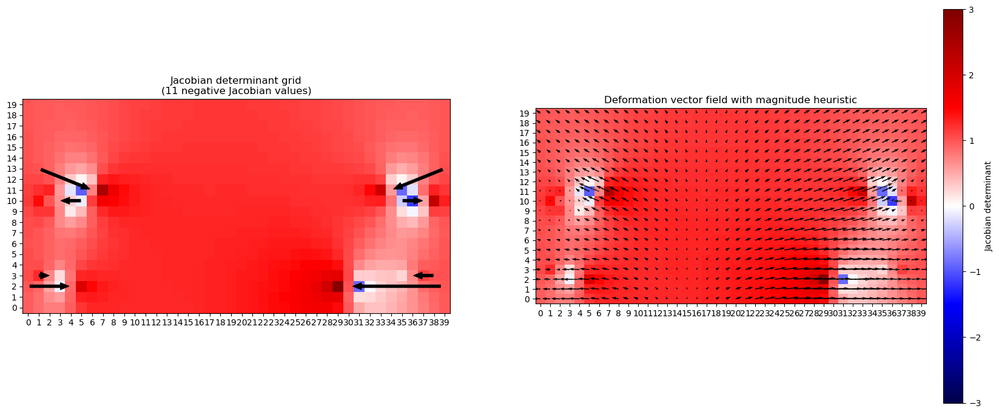

Iteration 112


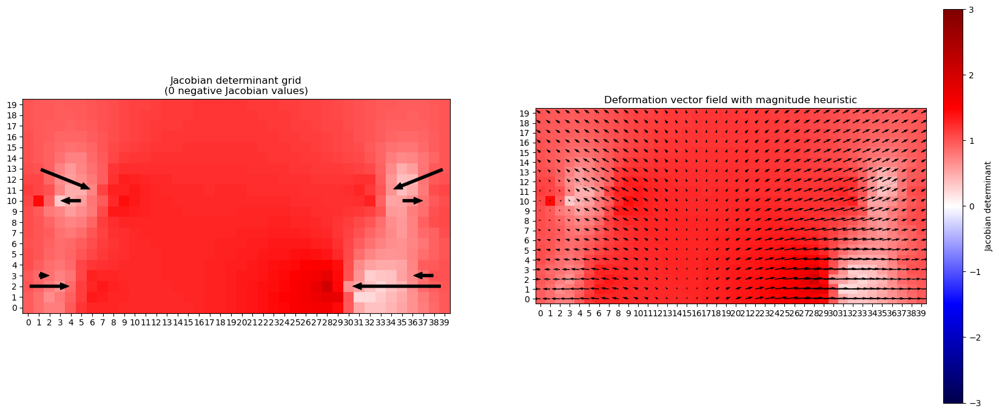

L1 error between original and modified deformation: 55.78009272931199
L2 error between original and modified deformation: 8.015189498284345


In [ ]:
title = "magnitude"

smoothness = smoothness_heuristic(deformation)
min_smoothness_coords = min_coords(smoothness)

print("Smoothness:")
pprint(smoothness)
print(f"Minimum smoothness value at coordinates: {min_smoothness_coords}")
print(f"Average vector at these coordinates: {get_3x3_vector_patch(deformation, *min_smoothness_coords)[1]}")
plot_deformation(msample, fsample, deformation, title=title, show_values=show_values, show_points=show_points)

# Replace the vector at the minimum smoothness coordinates with the average vector
deformation_modified = deformation.copy()
i = 0
while np.sum(jacobian.sitk_jacobian_determinant(deformation_modified) <= 0) > 0:
    deformation_modified = replace_lowest_smoothness(deformation_modified, heuristic_func=magnitude_heuristic)
    
    # Print the iteration number and plot the deformation 
    # if it's the first iteration or if there are no negative Jacobian values
    if np.sum(jacobian.sitk_jacobian_determinant(deformation_modified) <= 0) == 0:
        print(f"Iteration {i+1}")
        plot_deformation(msample, fsample, deformation_modified, title=title, show_values=show_values, show_points=show_points)
    i += 1
    
# Compare error difference between original and modified deformation vector fields
# L1 error between original and modified deformation
print(f"L1 error between original and modified deformation: {l1_error(deformation, deformation_modified)}")

# L2 error between original and modified deformation
print(f"L2 error between original and modified deformation: {l2_error(deformation, deformation_modified)}")

### Combined

Smoothness:
array([[0.99538969, 0.98158395, 0.98168566, 0.9810852 , 0.98023357, 0.97905304, 0.97795557, 0.976294  , 0.97539037, 0.97453712, 0.97238189, 0.96941629, 0.96327506, 0.9345691 , 0.98675999, 0.96187374, 0.94788992, 0.93500816, 0.91924008, 0.90086311, 0.87757127, 0.87399492, 0.64391325, 0.89984152, 0.91192612, 0.92924478, 0.93468624, 0.93233605, 0.92798995, 0.93165257, 0.95117966, 0.99644738, 0.9482841 , 0.90566832, 0.92472349, 0.94471647, 0.95545981, 0.96179171, 0.9655759 , 0.99995323],
       [0.98721182, 0.99892675, 0.99906106, 0.99882832, 0.99866108, 0.99853911, 0.99826894, 0.99788351, 0.99754253, 0.99710522, 0.99611514, 0.99307582, 0.9871872 , 0.95508216, 0.96262307, 0.99059932, 0.99411802, 0.99586601, 0.99827399, 0.99694348, 0.97760969, 0.86563412, 0.        , 0.89288353, 0.97999103, 0.99323119, 0.99607645, 0.99738999, 0.99954126, 0.99666296, 0.99821431, 0.99768419, 0.96823209, 0.99514354, 0.99620018, 0.99780092, 0.99760957, 0.99920402, 0.99962911, 0.96702301],
       [0.

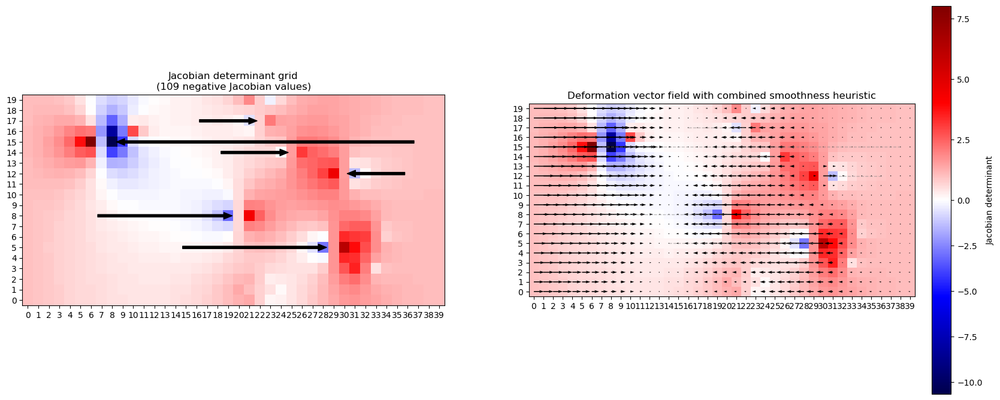

In [ ]:
title = "combined smoothness"

smoothness = smoothness_heuristic(deformation)
min_smoothness_coords = min_coords(smoothness)

print("Smoothness:")
pprint(smoothness)
print(f"Minimum smoothness value at coordinates: {min_smoothness_coords}")
print(f"Average vector at these coordinates: {get_3x3_vector_patch(deformation, *min_smoothness_coords)[1]}")
plot_deformation(msample, fsample, deformation, title=title, show_values=show_values, show_points=show_points)

# Replace the vector at the minimum smoothness coordinates with the average vector
deformation_modified = deformation.copy()
i = 0
while np.sum(jacobian.sitk_jacobian_determinant(deformation_modified) <= 0) > 0:
    deformation_modified = replace_lowest_smoothness(deformation_modified, heuristic_func=smoothness_heuristic)
    
    # Print the iteration number and plot the deformation 
    # if it's the first iteration or if there are no negative Jacobian values
    if np.sum(jacobian.sitk_jacobian_determinant(deformation_modified) <= 0) == 0:
        print(f"Iteration {i+1}")
        plot_deformation(msample, fsample, deformation_modified, title=title, show_values=show_values, show_points=show_points)
    i += 1
    
# Compare error difference between original and modified deformation vector fields
# L1 error between original and modified deformation
print(f"L1 error between original and modified deformation: {l1_error(deformation, deformation_modified)}")

# L2 error between original and modified deformation
print(f"L2 error between original and modified deformation: {l2_error(deformation, deformation_modified)}")